# Guidelines

In [1]:
###

# Imports

In [2]:
%reload_ext autoreload
%autoreload 2

import os
import re
import math
import warnings
import missingno as msno
import numpy as np
import pandas as pd
import seaborn as sns
import folium
import datetime
import nltk
import gensim
import pyLDAvis 
import imblearn
import pickle
import plotly.express as px
from IPython import display
from pyLDAvis import sklearn
from matplotlib import pyplot as plt
from pandas_profiling import ProfileReport
from datetime import datetime
from collections import defaultdict, Counter
from folium import IFrame
from xgboost import XGBClassifier, XGBRFClassifier
from sklearn import set_config
from matplotlib.ticker import MaxNLocator
from folium.plugins import HeatMap
from yellowbrick.features import RadViz
from yellowbrick.datasets import load_concrete
from yellowbrick.regressor import PredictionError, ResidualsPlot
from yellowbrick.regressor.alphas import AlphaSelection
from sklearn.metrics import accuracy_score, plot_confusion_matrix, classification_report, fbeta_score
from sklearn.decomposition import PCA, LatentDirichletAllocation
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor, make_column_selector
from sklearn.pipeline import Pipeline as pipeline
from sklearn.pipeline import make_pipeline
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder, QuantileTransformer, RobustScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.dummy import DummyClassifier
from sklearn.naive_bayes import MultinomialNB, ComplementNB
from sklearn.manifold import TSNE
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering, Birch
from sklearn.impute import SimpleImputer
from sklearn.metrics.cluster import adjusted_rand_score
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.classify import NaiveBayesClassifier
from PIL import Image, ImageOps, ImageFilter
from scipy.sparse import coo_matrix, csr_matrix 
from yellowbrick.cluster import KElbowVisualizer
from geopy.geocoders import Nominatim
from mpl_toolkits.mplot3d import Axes3D


#
from P7_02_utils import *
#
pd.options.mode.chained_assignment = None  # default='warn'
#
%matplotlib inline
#
set_config(display='diagram', print_changed_only=False)
#
pd.set_option("display.max_columns", None)
pd.set_option('display.max_colwidth', 100)
#
warnings.filterwarnings('ignore')
# Setting theme
sns.set_theme(style="white")
#
#nltk.download('wordnet')
#
#%reload_ext pycodestyle_magic
#%flake8_on
#%flake8_off

# Set the style of plots
#plt.style.use('fivethirtyeight')

# Download

In [3]:
# Check .csv file size
files_name_list = ["application_test", 
                      "application_train", 
                      "bureau_balance", 
                      "bureau",
                      "credit_card_balance",
                      "HomeCredit_columns_description",
                      "installments_payments",
                      "POS_CASH_balance",
                      "previous_application",
                      "sample_submission"
                     ]

for file_name in files_name_list:
    print(file_name + ": " + str(os.stat(r"./data/" + file_name + ".csv").st_size / 2**30) + ' Go')


application_test: 0.024743053130805492 Go
application_train: 0.1547237578779459 Go
bureau_balance: 0.34979813639074564 Go
bureau: 0.1583404066041112 Go
credit_card_balance: 0.39542336482554674 Go
HomeCredit_columns_description: 3.481563180685043e-05 Go
installments_payments: 0.6734564425423741 Go
POS_CASH_balance: 0.36573331616818905 Go
previous_application: 0.37716076988726854 Go
sample_submission: 0.0004993770271539688 Go


In [4]:
# Import and convert .csv files into pandas dataframes

for file_name in files_name_list:
    
    if file_name != "HomeCredit_columns_description":
        globals()["df_" + file_name] = pd.read_csv("./data/" + file_name + ".csv",
                                                     sep=",",
                                                     encoding="utf-8")

    else:
        globals()["df_" + file_name] = pd.read_csv("./data/" + "HomeCredit_columns_description" + ".csv",
                                                     sep=None,
                                                     encoding="latin1")

# Data 

## df_application_test

### Initial analysis

In [5]:
# Overview
info(df_application_test)
df_application_test.head()

121 columns
48744 rows
Rate of missing values : 23.811686761532343 %



,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married

In [6]:
df_application_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB


In [7]:
# CAST
list_to_cast = ['SK_ID_CURR']

# Cast non-computable numerical variables as strings
df_application_test[list_to_cast] = df_application_test[list_to_cast].astype(str)

In [8]:
df_application_test.describe(include='all')

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744,48744,48744,48744,48744,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,47833,48744,48744,48744,48744,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,16432.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,33139,48744.000000,48744.000000,48744.000000,48744,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744,28212.000000,48736.000000,40076.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,15947,25125,26120.000000,24851,26535,48715.000000,48715.000000,48715.000000,48715.000000,48744.000000,48744.0,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.0,48744.000000,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
unique,48744,2,2,2,2,NaN,NaN,NaN,NaN,NaN,7,7,5,5,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,3,NaN,7,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

<AxesSubplot:>

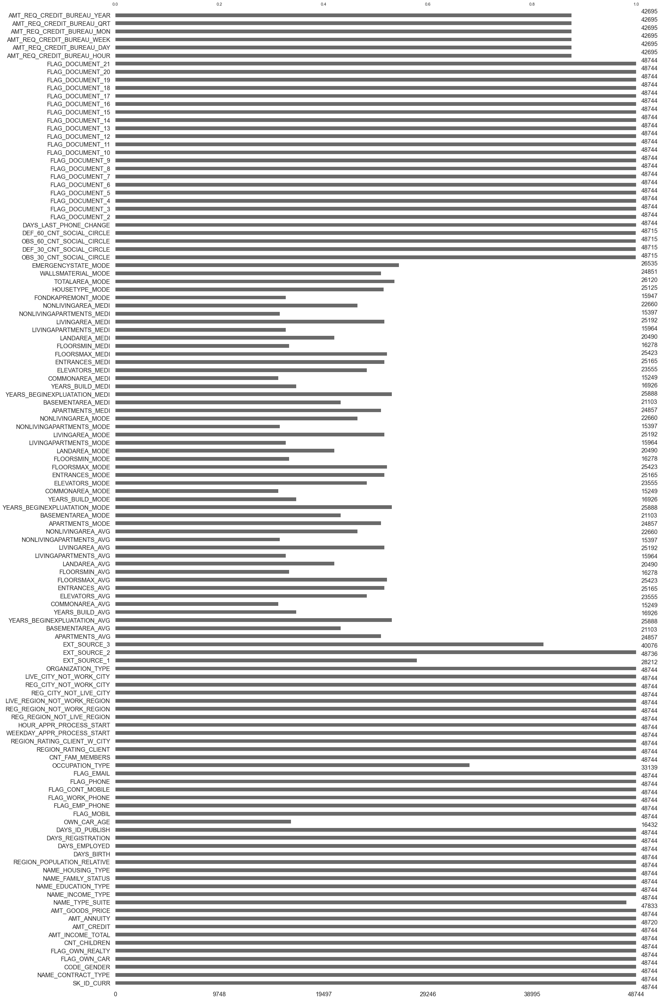

In [9]:
msno.bar(df_application_test)

### Cleaning 

In [10]:
# remove 4 applications with XNA CODE_GENDER (train set)
df_application_test = df_application_test[df_application_test['CODE_GENDER'] != 'XNA']


### Features engineering

In [11]:
# Cf. df_application_train

In [12]:
'''# pandas_profiling
profile_application_test = ProfileReport(df_application_test, title="application_test")
profile_application_test.to_notebook_iframe()'''

'# pandas_profiling\nprofile_application_test = ProfileReport(df_application_test, title="application_test")\nprofile_application_test.to_notebook_iframe()'

## df_application_train

### Initial analysis

In [13]:
# Overview
info(df_application_train)
df_application_train.head()

122 columns
307511 rows
Rate of missing values : 24.39594190712943 %



,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [14]:
#df_application_train.info()

In [15]:
# CAST
list_to_cast = ['SK_ID_CURR']

# Cast non-computable numerical variables as strings
df_application_train[list_to_cast] = df_application_train[list_to_cast].astype(str)

In [16]:
df_application_train.describe(include='all')

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511,307511.000000,307511,307511,307511,307511,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,306219,307511,307511,307511,307511,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,211120,307509.000000,307511.000000,307511.000000,307511,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,97216,153214,159080.000000,151170,161756,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
unique,307511,NaN,2,3,2,2,NaN,NaN,NaN,NaN,NaN,7,8,5,6,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

<AxesSubplot:>

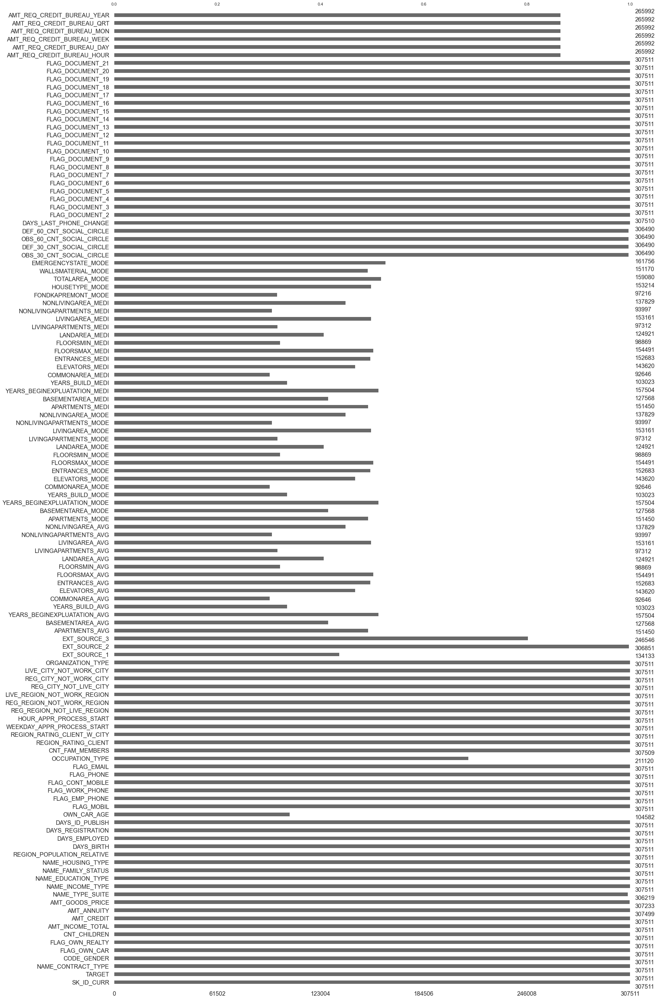

In [17]:
msno.bar(df_application_train)

### Cleaning

In [18]:
# nan values for DAYS_EMPLOYED: 365243 -> nan
df_application_train['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)

# remove 4 applications with XNA CODE_GENDER (train set)
df_application_train = df_application_train[df_application_train['CODE_GENDER'] != 'XNA']

### Exploration

In [19]:
# cf. Kaggle Home Credit Default Risk 
# WILL KOEHRSEN · 4Y AGO 
# Start Here: A Gentle Introduction

#### a. Labels

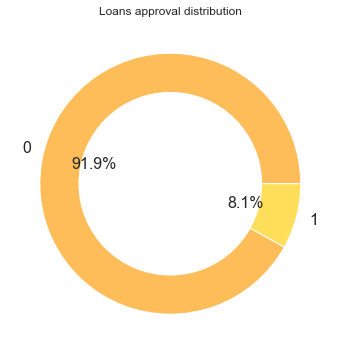

In [20]:
# Subplot
fig, ax = plt.subplots(figsize=(6,6))
fig.set_facecolor('white')

# Plot
pie = df_application_train.groupby('TARGET').agg({'TARGET':'count'})
pie['TARGET'].plot(kind = "pie",          
                     title = "Loans approval distribution",
                     xlabel = "",
                     ylabel= "",
                     autopct = '%1.1f%%',
                     colors = ["#ffbd59","#ffde59"],
                     textprops={'fontsize': 16},
                     ax = ax)

# Adding white circle for styling purposes
my_circle = plt.Circle((0,0), 0.7, color='white')
p = plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

In [21]:
#df_application_train.TARGET.value_counts()

#### b. Occupation

In [22]:
# data
df = (df_application_train.groupby('OCCUPATION_TYPE')
                      .agg({'OCCUPATION_TYPE':'count'})
                      .rename(columns={'OCCUPATION_TYPE':'OCCUPATION_TYPE_COUNT'})
                      .sort_values(by=['OCCUPATION_TYPE_COUNT'], 
                                   ascending=False))
            

# calculate the cumulative ratio 
df['accumulative_ratio'] = df['OCCUPATION_TYPE_COUNT'].cumsum() / df['OCCUPATION_TYPE_COUNT'].sum()

#
df.head()

,OCCUPATION_TYPE_COUNT,accumulative_ratio
OCCUPATION_TYPE,,
Laborers,55186,0.261399
Sales staff,32102,0.413456
Core staff,27569,0.544042
Managers,21371,0.645269
Drivers,18603,0.733386


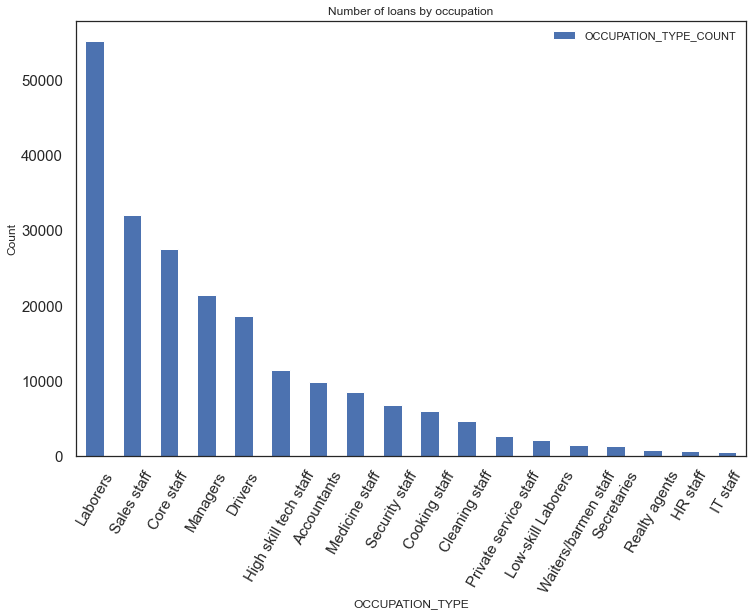

In [23]:
df.drop(columns={'accumulative_ratio'}).plot.bar(title='Number of loans by occupation',
                                                 ylabel='Count',
                                                 #edgecolor = 'k',
                                                 figsize=(12,8),
                                                 fontsize=15)

                     

plt.xticks(rotation='60')
plt.show()

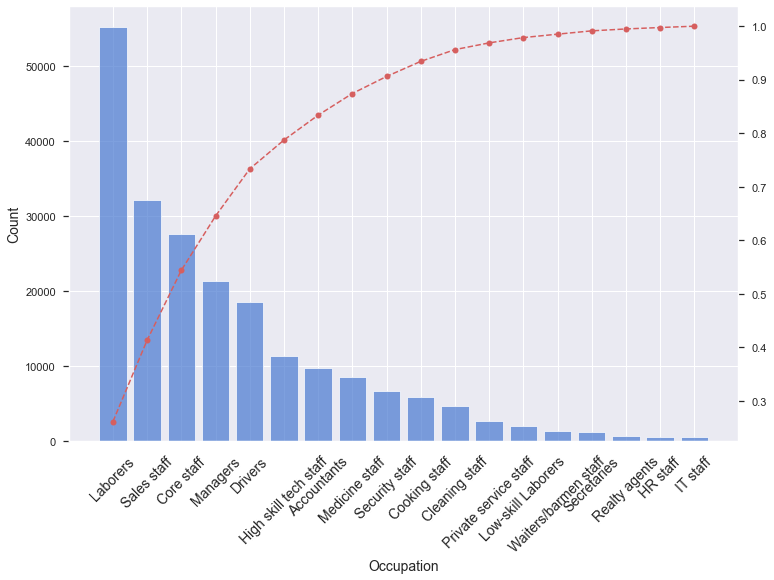

In [24]:
# other graph with cumulative line
# plot in seaborn style
sns.set(style="darkgrid", palette="muted", color_codes=True)

# 
fig, ax = plt.subplots(figsize=(12,8))

#
bar = ax.bar(df.index,
             height=df['OCCUPATION_TYPE_COUNT'],
             align='center',
             tick_label=df.index,
             alpha=0.7,
             )

#
ax2 = ax.twinx()
line = ax2.plot(df.index,
                df['accumulative_ratio'],
                ls='--',
                marker='o',
                color='r'
                )

ax2.grid(visible=False)
ax.set_xticklabels(df.index, rotation=45, fontsize=14)
ax.set_ylabel('Count', fontsize=14)
ax.set_xlabel('Occupation', fontsize=14)
plt.show()

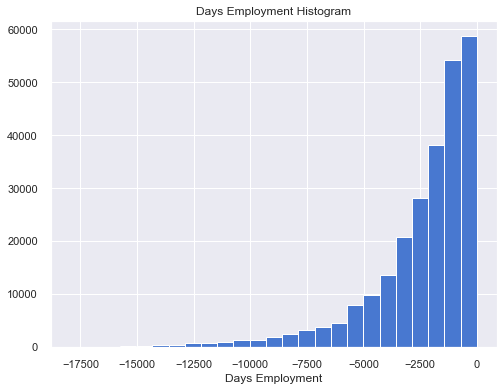

In [25]:
# Create an anomalous flag column
df_application_train['DAYS_EMPLOYED_ANOM'] = df_application_train["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
df_application_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

# plot
plt.figure(figsize=(8,6))

plt.hist(df_application_train['DAYS_EMPLOYED'], 
         #edgecolor = 'k', 
         bins = 25)
plt.title('Days Employment Histogram')
plt.xlabel('Days Employment')
plt.show()

#### c. Age

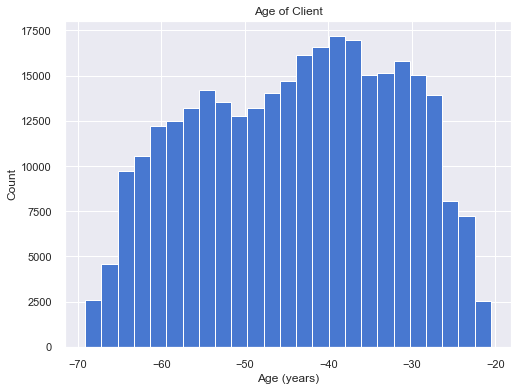

In [26]:
# Plot the distribution of ages in years
plt.figure(figsize=(8,6))

plt.hist(df_application_train['DAYS_BIRTH'] / 365, 
         #edgecolor = 'k', 
         bins = 25)
plt.title('Age of Client')
plt.xlabel('Age (years)')
plt.ylabel('Count')
plt.show()

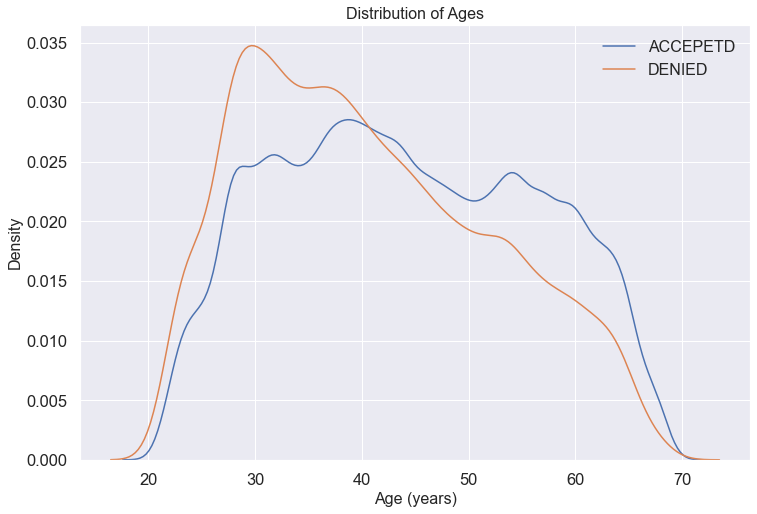

In [27]:
plt.figure(figsize = (12, 8))

sns.set(font_scale = 1.5)


# KDE plot of loans that were repaid on time
sns.kdeplot(-df_application_train.loc[df_application_train['TARGET'] == 0, 'DAYS_BIRTH'] / 365, 
            label = 'ACCEPETD')
           

# KDE plot of loans which were not repaid on time
sns.kdeplot(-df_application_train.loc[df_application_train['TARGET'] == 1, 'DAYS_BIRTH'] / 365, 
            label = 'DENIED')

# Labeling of plot
plt.xlabel('Age (years)', fontsize=16)
plt.ylabel('Density', fontsize=16) 
plt.title('Distribution of Ages', fontsize=16)
plt.legend(fontsize=16)
plt.show()

In [28]:
# Age information into a separate dataframe
age_data = df_application_train[['TARGET', 'DAYS_BIRTH']]
age_data['DAYS_BIRTH'] = -age_data['DAYS_BIRTH']
age_data['YEARS_BIRTH'] = age_data['DAYS_BIRTH'] / 365

# Bin the age data
age_data['YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

,TARGET,DAYS_BIRTH,YEARS_BIRTH,YEARS_BINNED
0,1,9461,25.920548,"(25.0, 30.0]"
1,0,16765,45.931507,"(45.0, 50.0]"
2,0,19046,52.180822,"(50.0, 55.0]"
3,0,19005,52.068493,"(50.0, 55.0]"
4,0,19932,54.608219,"(50.0, 55.0]"
5,0,16941,46.413699,"(45.0, 50.0]"
6,0,13778,37.747945,"(35.0, 40.0]"
7,0,18850,51.643836,"(50.0, 55.0]"
8,0,20099,55.065753,"(55.0, 60.0]"
9,0,14469,39.641096,"(35.0, 40.0]"


In [29]:
# Group by the bin and calculate averages
age_groups  = age_data.groupby('YEARS_BINNED').mean()
age_groups

,TARGET,DAYS_BIRTH,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",0.123036,8532.795625,23.377522
"(25.0, 30.0]",0.111442,10155.219690,27.822520
"(30.0, 35.0]",0.102814,11854.848377,32.479037
"(35.0, 40.0]",0.089416,13707.908041,37.555912
"(40.0, 45.0]",0.078491,15497.661233,42.459346
"(45.0, 50.0]",0.074171,17323.900441,47.462741
"(50.0, 55.0]",0.066968,19196.494791,52.593136
"(55.0, 60.0]",0.055316,20984.285455,57.491193
"(60.0, 65.0]",0.052737,22780.547460,62.412459


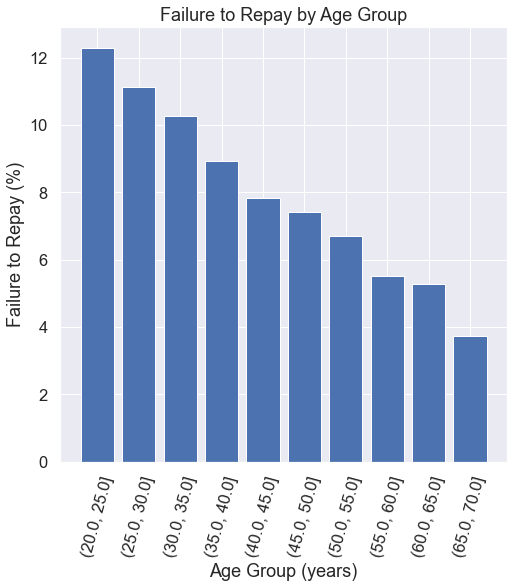

In [30]:
#plot
plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 
        100 * age_groups['TARGET'], 
        #edgecolor = 'k'
       )

# Plot labeling
plt.xticks(rotation = 75) 
plt.xlabel('Age Group (years)') 
plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group')

plt.show()

#### d. Correlations

In [31]:
# Find correlations with the target and sort
correlations = df_application_train.corr()['TARGET'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))


Most Positive Correlations:
 LIVE_CITY_NOT_WORK_CITY        0.032517
OWN_CAR_AGE                    0.037611
DAYS_REGISTRATION              0.041976
FLAG_DOCUMENT_3                0.044341
REG_CITY_NOT_LIVE_CITY         0.044394
FLAG_EMP_PHONE                 0.045984
REG_CITY_NOT_WORK_CITY         0.050992
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.055219
REGION_RATING_CLIENT           0.058901
REGION_RATING_CLIENT_W_CITY    0.060895
DAYS_EMPLOYED                  0.074957
DAYS_BIRTH                     0.078242
TARGET                         1.000000
DAYS_EMPLOYED_ANOM                  NaN
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178926
EXT_SOURCE_2                 -0.160471
EXT_SOURCE_1                 -0.155317
FLOORSMAX_AVG                -0.044009
FLOORSMAX_MEDI               -0.043773
FLOORSMAX_MODE               -0.043231
AMT_GOODS_PRICE              -0.039647
REGION_POPULATION_RELATIVE   -0.037225


In [32]:
# Extract the EXT_SOURCE variables and show correlations
ext_data = df_application_train[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]
ext_data_corrs = ext_data.corr()
ext_data_corrs

,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH
TARGET,1.000000,-0.155317,-0.160471,-0.178926,0.078242
EXT_SOURCE_1,-0.155317,1.000000,0.213982,0.186845,-0.600621
EXT_SOURCE_2,-0.160471,0.213982,1.000000,0.109182,-0.092009
EXT_SOURCE_3,-0.178926,0.186845,0.109182,1.000000,-0.205465
DAYS_BIRTH,0.078242,-0.600621,-0.092009,-0.205465,1.000000


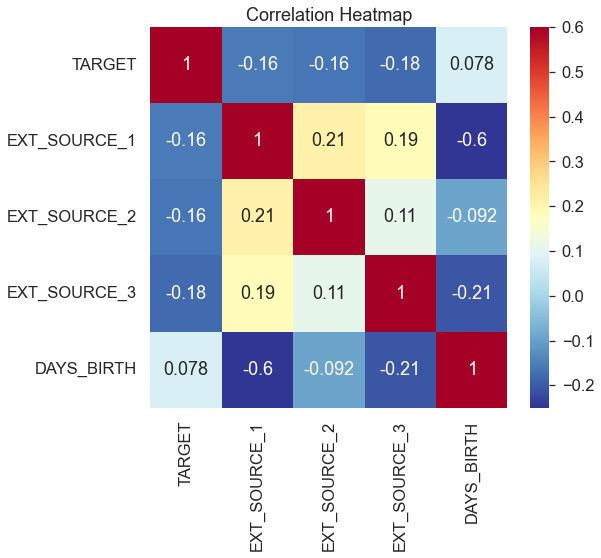

In [33]:
plt.figure(figsize = (8, 7))

# Heatmap of correlations
sns.heatmap(ext_data_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap');

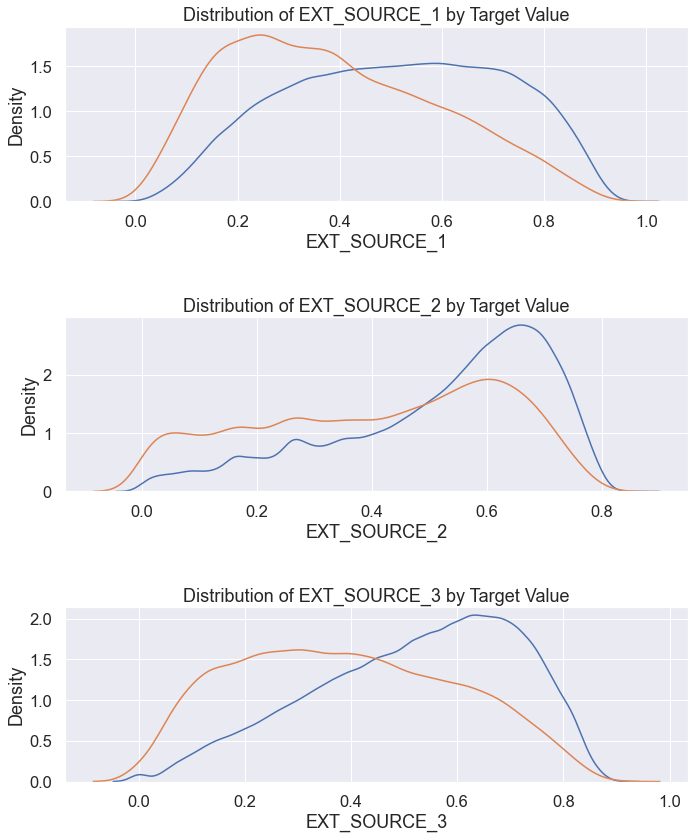

In [34]:
plt.figure(figsize = (10, 12))

# iterate through the sources
for i, source in enumerate(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']):
    
    # create a new subplot for each source
    plt.subplot(3, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(df_application_train.loc[df_application_train['TARGET'] == 0, source], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(df_application_train.loc[df_application_train['TARGET'] == 1, source], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % source)
    plt.xlabel('%s' % source); plt.ylabel('Density');
    
plt.tight_layout(h_pad = 2.5)

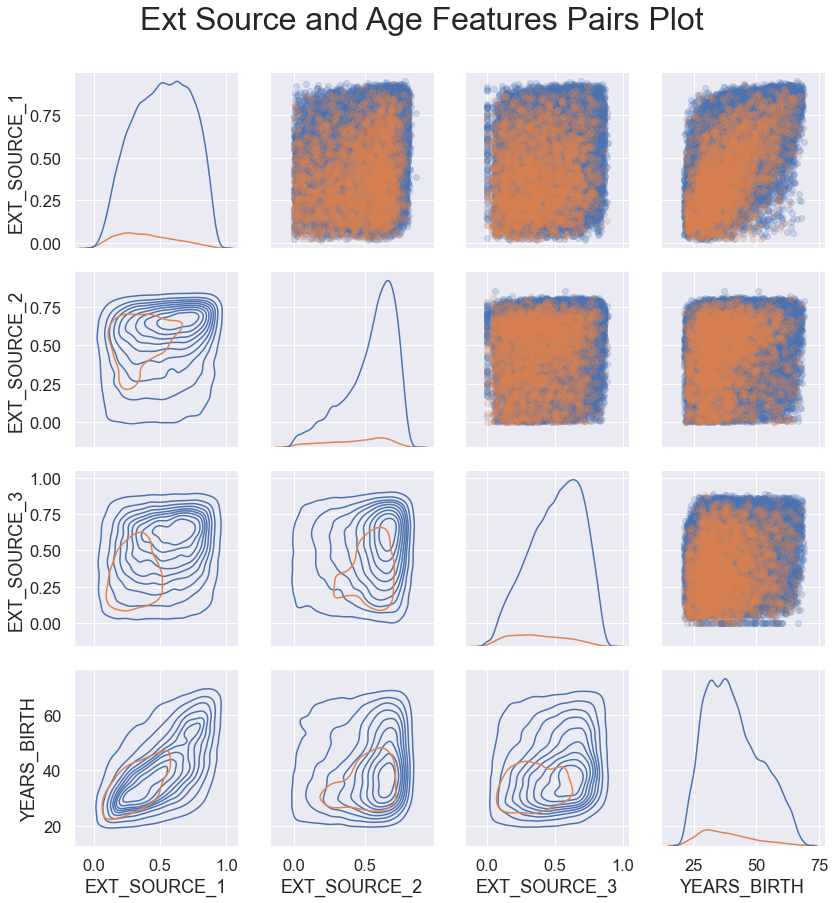

In [35]:
# Copy the data for plotting
plot_data = ext_data.drop(columns = ['DAYS_BIRTH']).copy()

# Add in the age of the client in years
plot_data['YEARS_BIRTH'] = age_data['YEARS_BIRTH']

# Drop na values and limit to first 100000 rows
plot_data = plot_data.dropna().loc[:100000, :]

# Function to calculate correlation coefficient between two columns
def corr_func(x, y, **kwargs):
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.2, .8), xycoords=ax.transAxes,
                size = 20)

# Create the pairgrid object
grid = sns.PairGrid(data = plot_data, size = 3, diag_sharey=False,
                    hue = 'TARGET', 
                    vars = [x for x in list(plot_data.columns) if x != 'TARGET'])

# Upper is a scatter plot
grid.map_upper(plt.scatter, alpha = 0.2)

# Diagonal is a histogram
grid.map_diag(sns.kdeplot)

# Bottom is density plot
grid.map_lower(sns.kdeplot, cmap = plt.cm.OrRd_r);

plt.suptitle('Ext Source and Age Features Pairs Plot', size = 32, y = 1.05);

### Features engineering

In [36]:
# merge test and train
df_application_test_train = df_application_train.append(df_application_test).reset_index()

# categorical features with Binary encode (0 or 1; two categories)
for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
    df_application_test_train[bin_feature], uniques = pd.factorize(df_application_test_train[bin_feature])
    
# some simple new features (percentages)
df_application_test_train['DAYS_EMPLOYED_PERC'] = df_application_test_train['DAYS_EMPLOYED'] / df_application_test_train['DAYS_BIRTH']
df_application_test_train['INCOME_CREDIT_PERC'] = df_application_test_train['AMT_INCOME_TOTAL'] / df_application_test_train['AMT_CREDIT']
df_application_test_train['INCOME_PER_PERSON'] = df_application_test_train['AMT_INCOME_TOTAL'] / df_application_test_train['CNT_FAM_MEMBERS']
df_application_test_train['ANNUITY_INCOME_PERC'] = df_application_test_train['AMT_ANNUITY'] / df_application_test_train['AMT_INCOME_TOTAL']
df_application_test_train['PAYMENT_RATE'] = df_application_test_train['AMT_ANNUITY'] / df_application_test_train['AMT_CREDIT']

# overview
info(df_application_test_train)
df_application_test_train.head()

129 columns
356251 rows
Rate of missing values : 23.42463926498648 %



,index,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
0,0,100002,1.0,Cash loans,0,0,0,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637.0,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,False,0.067329,0.498036,202500.0,0.121978,0.060749
1,1,100003,0.0,Cash loans,1,0,1,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188.0,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False,0.070862,0.208736,135000.0,0.132217,0.027598
2,2,100004,0.0,Revolving loans,0,1,0,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046

In [37]:
'''plt.figure(figsize = (12, 20))

# iterate through the new features
for i, feature in enumerate(fe_list):
    
    # create a new subplot for each source
    plt.subplot(4, 1, i + 1)
    
    # plot repaid loans
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 0, feature], label = 'target == 0')
    
    # plot loans that were not repaid
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 1, feature], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % feature)
    plt.xlabel('%s' % feature)
    plt.ylabel('Density')
    
plt.tight_layout(h_pad = 2.5)'''

"plt.figure(figsize = (12, 20))\n\n# iterate through the new features\nfor i, feature in enumerate(fe_list):\n    \n    # create a new subplot for each source\n    plt.subplot(4, 1, i + 1)\n    \n    # plot repaid loans\n    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 0, feature], label = 'target == 0')\n    \n    # plot loans that were not repaid\n    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 1, feature], label = 'target == 1')\n    \n    # Label the plots\n    plt.title('Distribution of %s by Target Value' % feature)\n    plt.xlabel('%s' % feature)\n    plt.ylabel('Density')\n    \nplt.tight_layout(h_pad = 2.5)"

In [38]:
'''# pandas_profiling
profile_application_train = ProfileReport(df_application_train, title="application_train")
profile_application_train.to_notebook_iframe()'''

'# pandas_profiling\nprofile_application_train = ProfileReport(df_application_train, title="application_train")\nprofile_application_train.to_notebook_iframe()'

## df_bureau_balance

### Initial analysis

In [39]:
# Overview
info(df_bureau_balance)
df_bureau_balance.head()

3 columns
27299925 rows
Rate of missing values : 0.0 %



,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [40]:
df_bureau_balance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


In [41]:
# CAST
list_to_cast = ['SK_ID_BUREAU']

# Cast non-computable numerical variables as strings
df_bureau_balance[list_to_cast] = df_bureau_balance[list_to_cast].astype(str)

In [42]:
df_bureau_balance.describe(include='all')

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
count,27299925,2.729992e+07,27299925
unique,817395,NaN,8
top,5645521,NaN,C
freq,97,NaN,13646993
mean,NaN,-3.074169e+01,NaN
std,NaN,2.386451e+01,NaN
min,NaN,-9.600000e+01,NaN
25%,NaN,-4.600000e+01,NaN
50%,NaN,-2.500000e+01,NaN
75%,NaN,-1.100000e+01,NaN


In [43]:
#
df = df_bureau_balance.groupby('SK_ID_BUREAU').agg({'SK_ID_BUREAU': 'count'}).rename(columns={'SK_ID_BUREAU':'Number of months'})                                           
df.head()

,Number of months
SK_ID_BUREAU,
5001709,97
5001710,83
5001711,4
5001712,19
5001713,22


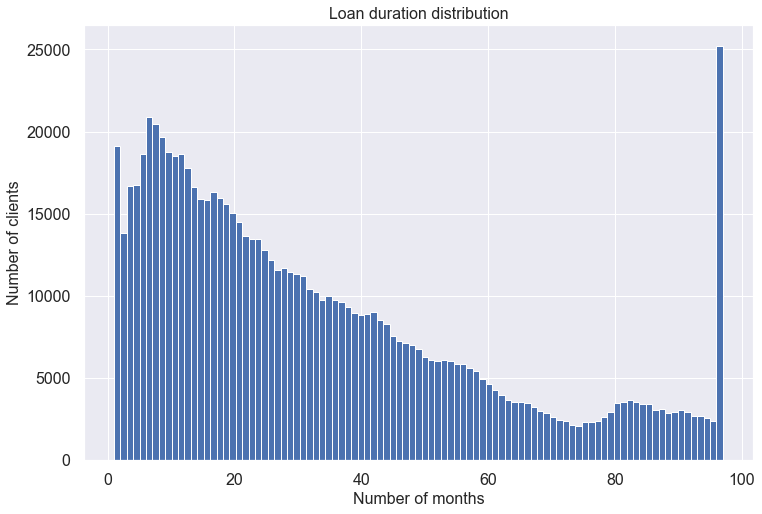

In [44]:
# Plot
df.hist(bins=95,
        figsize=(12,8),
        xlabelsize=16,
        ylabelsize=16
       )

plt.title('Loan duration distribution', fontsize=16)
plt.xlabel("Number of months", fontsize=16)
plt.ylabel("Number of clients", fontsize=16)

plt.show()

### Cleaning

In [45]:
#

### Features engineering

In [46]:
# numerical
aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}

'''# categorical
for col in df_bureau_balance.select_dtypes('object').columns.tolist():
    aggregations[col] = ['mean']'''
    
# aggregation
df_bureau_balance_agg = df_bureau_balance.groupby('SK_ID_BUREAU').agg(aggregations)
# rename columns
df_bureau_balance_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in df_bureau_balance_agg.columns.tolist()])

# overview
info(df_bureau_balance_agg)
df_bureau_balance_agg.head()

3 columns
817395 rows
Rate of missing values : 0.0 %



,MONTHS_BALANCE_MIN,MONTHS_BALANCE_MAX,MONTHS_BALANCE_SIZE
SK_ID_BUREAU,,,
5001709,-96,0,97
5001710,-82,0,83
5001711,-3,0,4
5001712,-18,0,19
5001713,-21,0,22


In [47]:
'''# pandas_profiling
profile_bureau_balance = ProfileReport(df_bureau_balance, title="bureau_balance")
profile_bureau_balance.to_notebook_iframe()'''

'# pandas_profiling\nprofile_bureau_balance = ProfileReport(df_bureau_balance, title="bureau_balance")\nprofile_bureau_balance.to_notebook_iframe()'

## df_bureau

### Initial analysis

In [48]:
# Overview
info(df_bureau)
df_bureau.head()

17 columns
1716428 rows
Rate of missing values : 13.502552290879322 %



,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [49]:
df_bureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB


In [50]:
# CAST
list_to_cast = ['SK_ID_CURR','SK_ID_BUREAU']

# Cast non-computable numerical variables as strings
df_bureau[list_to_cast] = df_bureau[list_to_cast].astype(str)

In [51]:
df_bureau.describe(include='all')

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1716428,1716428,1716428,1716428,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1716428,1.716428e+06,4.896370e+05
unique,305811,1716428,4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,NaN,NaN
top,120860,5714462,Closed,currency 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Consumer credit,NaN,NaN
freq,116,1,1079273,1715020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1251615,NaN,NaN
mean,NaN,NaN,NaN,NaN,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,NaN,-5.937483e+02,1.571276e+04
std,NaN,NaN,NaN,NaN,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,NaN,7.207473e+02,3.258269e+05
min,NaN,NaN,NaN,NaN,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,NaN,-4.194700e+04,0.000000e+00
25%,NaN,NaN,NaN,NaN,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,NaN,-9.080000e+02,0.000000e+00
50%,NaN,NaN,NaN,NaN,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,NaN,-3.950000e+02,0.000000e+00
75%,NaN,NaN,NaN,NaN,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,NaN,-3.300000e+01,1.350000e+04


<AxesSubplot:>

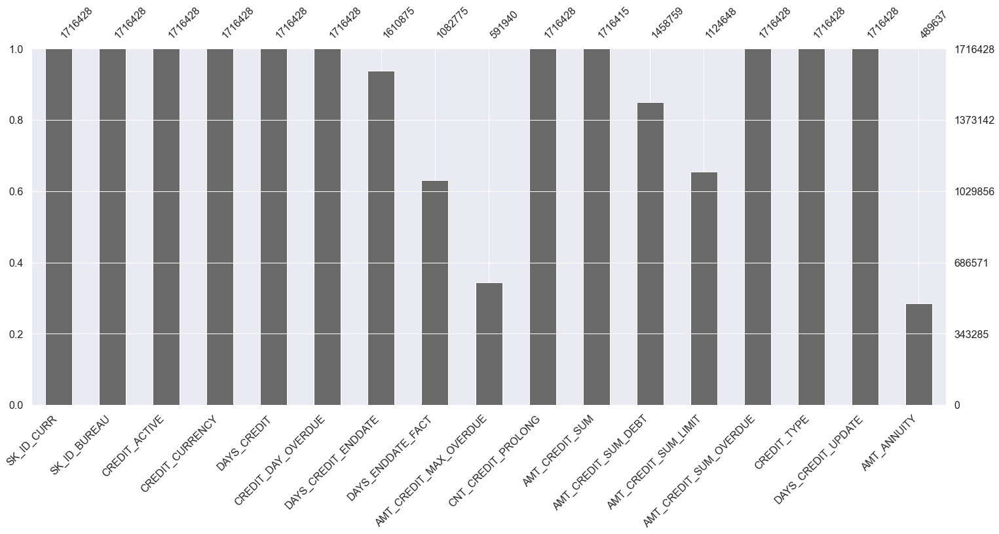

In [52]:
msno.bar(df_bureau)

### Cleaning

### Features engineering

In [53]:
# merge with bureau balance
df_bureau = df_bureau.join(df_bureau_balance_agg, how='left', on='SK_ID_BUREAU')

# numerical 
num_aggregations = {
    'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
    'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
    'DAYS_CREDIT_UPDATE': ['mean'],
    'CREDIT_DAY_OVERDUE': ['max', 'mean'],
    'AMT_CREDIT_MAX_OVERDUE': ['mean'],
    'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_OVERDUE': ['mean'],
    'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
    'AMT_ANNUITY': ['max', 'mean'],
    'CNT_CREDIT_PROLONG': ['sum'],
    'MONTHS_BALANCE_MIN': ['min'],
    'MONTHS_BALANCE_MAX': ['max'],
    'MONTHS_BALANCE_SIZE': ['mean', 'sum']
}

# categorical 
cat_aggregations = {}

'''for cat in df_bureau.select_dtypes('object').columns.tolist(): 
    cat_aggregations[cat] = ['mean']
    
for cat in df_bureau_balance.select_dtypes('object').columns.tolist(): 
    cat_aggregations[cat + "_MEAN"] = ['mean']'''

# aggregation
df_bureau_agg = (df_bureau.drop(['SK_ID_BUREAU'], axis=1)
                          .groupby('SK_ID_CURR')
                          .agg({**num_aggregations, **cat_aggregations})
                )

# rename columns
df_bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in df_bureau_agg.columns.tolist()])

# bureau: active credits - using only numerical aggregations
active = df_bureau[df_bureau['CREDIT_ACTIVE'] == 1]
# aggregation
active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
# rename columns
active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
# merge with active_agg
df_bureau_agg = df_bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')

# bureau: closed credits - using only numerical aggregations
closed = df_bureau[df_bureau['CREDIT_ACTIVE'] == 1]
# aggregation
closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)          
# rename columns
closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
# merge with closed_agg
df_bureau_agg = df_bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')

# overview
info(df_bureau_agg)
df_bureau_agg.head()

81 columns
305811 rows
Rate of missing values : 70.99901250231575 %



,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_AMT_CREDIT_MAX_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_ANNUITY_MAX,BURO_AMT_ANNUITY_MEAN,BURO_CNT_CREDIT_PROLONG_SUM,BURO_MONTHS_BALANCE_MIN_MIN,BURO_MONTHS_BALANCE_MAX_MAX,BURO_MONTHS_BALANCE_SIZE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,ACTIVE_DAYS_CREDIT_MIN,ACTIVE_DAYS_CREDIT_MAX,ACTIVE_DAYS_CREDIT_MEAN,ACTIVE_DAYS_CREDIT_VAR,ACTIVE_DAYS_CREDIT_ENDDATE_MIN,ACTIVE_DAYS_CREDIT_ENDDATE_MAX,ACTIVE_DAYS_CREDIT_ENDDATE_MEAN,ACTIVE_DAYS_CREDIT_UPDATE_MEAN,ACTIVE_CREDIT_DAY_OVERDUE_MAX,ACTIVE_CREDIT_DAY_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_MAX_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_SUM_MAX,ACTIVE_AMT_CREDIT_SUM_MEAN,ACTIVE_AMT_CREDIT_SUM_SUM,ACTIVE_AMT_CREDIT_SUM_DEBT_MAX,ACTIVE_AMT_CREDIT_SUM_DEBT_MEAN,ACTIVE_AMT_CREDIT_SUM_DEBT_SUM,ACTIVE_AMT_CREDIT_SUM_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_SUM_LIMIT_MEAN,ACTIVE_AMT_CREDIT_SUM_LIMIT_SUM,ACTIVE_AMT_ANNUITY_MAX,ACTIVE_AMT_ANNUITY_MEAN,ACTIVE_CNT_CREDIT_PROLONG_SUM,ACTIVE_MONTHS_BALANCE_MIN_MIN,ACTIVE_MONTHS_BALANCE_MAX_MAX,ACTIVE_MONTHS_BALANCE_SIZE_MEAN,ACTIVE_MONTHS_BALANCE_SIZE_SUM,CLOSED_DAYS_CREDIT_MIN,CLOSED_DAYS_CREDIT_MAX,CLOSED_DAYS_CREDIT_MEAN,CLOSED_DAYS_CREDIT_VAR,CLOSED_DAYS_CREDIT_ENDDATE_MIN,CLOSED_DAYS_CREDIT_ENDDATE_MAX,CLOSED_DAYS_CREDIT_ENDDATE_MEAN,CLOSED_DAYS_CREDIT_UPDATE_MEAN,CLOSED_CREDIT_DAY_OVERDUE_MAX,CLOSED_CREDIT_DAY_OVERDUE_MEAN,CLOSED_AMT_CREDIT_MAX_OVERDUE_MEAN,CLOSED_AMT_CREDIT_SUM_MAX,CLOSED_AMT_CREDIT_SUM_MEAN,CLOSED_AMT_CREDIT_SUM_SUM,CLOSED_AMT_CREDIT_SUM_DEBT_MAX,CLOSED_AMT_CREDIT_SUM_DEBT_MEAN,CLOSED_AMT_CREDIT_SUM_DEBT_SUM,CLOSED_AMT_CREDIT_SUM_OVERDUE_MEAN,CLOSED_AMT_CREDIT_SUM_LIMIT_MEAN,CLOSED_AMT_CREDIT_SUM_LIMIT_SUM,CLOSED_AMT_ANNUITY_MAX,CLOSED_AMT_ANNUITY_MEAN,CLOSED_CNT_CREDIT_PROLONG_SUM,CLOSED_MONTHS_BALANCE_MIN_MIN,CLOSED_MONTHS_BALANCE_MAX_MAX,CLOSED_MONTHS_BALANCE_SIZE_MEAN,CLOSED_MONTHS_BALANCE_SIZE_SUM
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100001,-1572,-49,-735.000000,240043.666667,-1329.0,1778.0,82.428571,-93.142857,0,0.0,NaN,378000.0,207623.571429,1453365.000,373239.0,85240.928571,596686.5,0.0,0.00000,0.000,10822.5,3545.357143,0,-51.0,0.0,24.571429,172.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100002,-1437,-103,-874.000000,186150.000000,-1072.0,780.0,-349.000000,-499.875000,0,0.0,1681.029,450000.0,108131.945625,865055.565,245781.0,49156.200000,245781.0,0.0,7997.14125,31988.565,0.0,0.000000,0,-47.0,0.0,13.750000,110.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100003,-2586,-606,-1400.750000,827783.583333,-2434.0,1216.0,-544.500000,-816.000000,0,0.0,0.000,810000.0,254350.125000,1017400.500,0.0,0.000000,0.0,0.0,202500.00000,810000.000,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100004,-1326,-408,-867.000000,421362.000000,-595.0,-382.0,-488.500000,-532.000000,0,0.0,0.000,94537.8,94518.900000,189037.800,0.0,0.000000,0.0,0.0,0.00000,0.000,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [54]:
'''# pandas_profiling
profile_bureau = ProfileReport(df_bureau, title="bureau")
profile_bureau.to_notebook_iframe()'''

'# pandas_profiling\nprofile_bureau = ProfileReport(df_bureau, title="bureau")\nprofile_bureau.to_notebook_iframe()'

## df_credit_card_balance

### Initial analysis

In [55]:
# Overview
info(df_credit_card_balance)
df_credit_card_balance.head()

23 columns
3840312 rows
Rate of missing values : 6.6540743926874795 %



,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.0,2250.0,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.0,11925.0,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.0,27000.0,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [56]:
df_credit_card_balance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_CURRENT    float64
 19  CNT_INSTALMENT_MATURE

In [57]:
# CAST
list_to_cast = ['SK_ID_PREV','SK_ID_CURR']

# Cast non-computable numerical variables as strings
df_credit_card_balance[list_to_cast] = df_credit_card_balance[list_to_cast].astype(str)

In [58]:
df_credit_card_balance.describe(include='all')

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
count,3840312,3840312,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,3.072324e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,3840312,3.840312e+06,3.840312e+06
unique,104307,103558,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,NaN,NaN
top,2377894,186401,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Active,NaN,NaN
freq,96,192,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3698436,NaN,NaN
mean,NaN,NaN,-3.452192e+01,5.830016e+04,1.538080e+05,5.961325e+03,7.433388e+03,2.881696e+02,2.968805e+03,3.540204e+03,1.028054e+04,7.588857e+03,5.596588e+04,5.808881e+04,5.809829e+04,3.094490e-01,7.031439e-01,4.812496e-03,5.594791e-01,2.082508e+01,NaN,9.283667e+00,3.316220e-01
std,NaN,NaN,2.666775e+01,1.063070e+05,1.651457e+05,2.822569e+04,3.384608e+04,8.201989e+03,2.079689e+04,5.600154e+03,3.607808e+04,3.200599e+04,1.025336e+05,1.059654e+05,1.059718e+05,1.100401e+00,3.190347e+00,8.263861e-02,3.240649e+00,2.005149e+01,NaN,9.751570e+01,2.147923e+01
min,NaN,NaN,-9.600000e+01,-4.202502e+05,0.000000e+00,-6.827310e+03,-6.211620e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-4.233058e+05,-4.202502e+05,-4.202502e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN,0.000000e+00,0.000000e+00
25%,NaN,NaN,-5.500000e+01,0.000000e+00,4.500000e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.523700e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00,NaN,0.000000e+00,0.000000e+00
50%,NaN,NaN,-2.800000e+01,0.000000e+00,1.125000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.702700e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.500000e+01,NaN,0.000000e+00,0.000000e+00
75%,NaN,NaN,-1.100000e+01,8.904669e+04,1.800000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.633911e+03,9.000000e+03,6.750000e+03,8.535924e+04,8.889949e+04,8.891451e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.200000e+01,NaN,0.000000e+00,0.000000e+00


<AxesSubplot:>

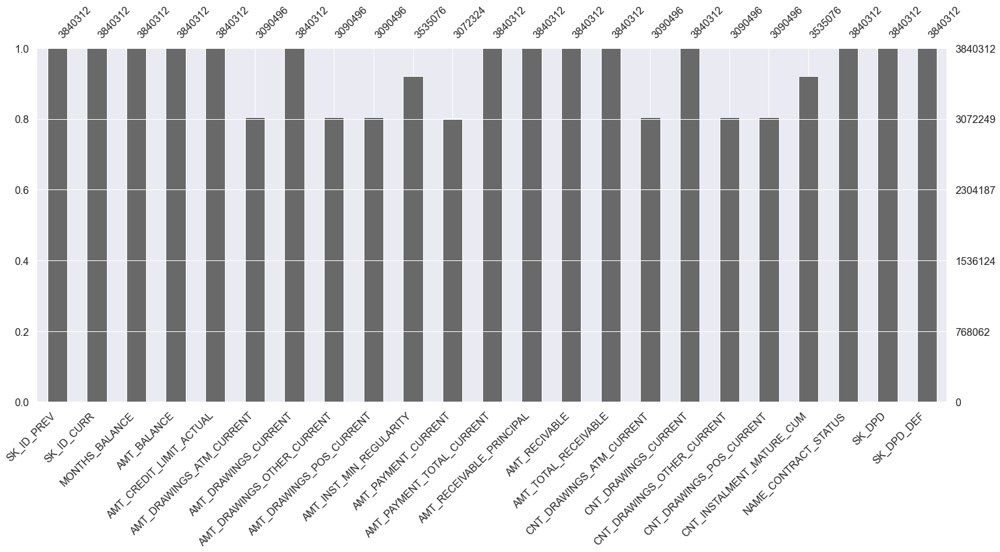

In [59]:
msno.bar(df_credit_card_balance)

### Cleaning

### Features engineering

In [60]:
# aggregation
df_credit_card_balance_agg = (df_credit_card_balance.drop(['SK_ID_PREV'], axis= 1)
                                                    .groupby('SK_ID_CURR')
                                                    .agg(['min', 'max', 'mean', 'sum', 'var'])
                             )

# rename columns
df_credit_card_balance_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in df_credit_card_balance_agg.columns.tolist()])

# Count credit card lines
df_credit_card_balance_agg['CC_COUNT'] = df_credit_card_balance.groupby('SK_ID_CURR').size()

# Overview
info(df_credit_card_balance_agg)
df_credit_card_balance_agg.head()

101 columns
103558 rows
Rate of missing values : 8.518821136058254 %



,CC_MONTHS_BALANCE_MIN,CC_MONTHS_BALANCE_MAX,CC_MONTHS_BALANCE_MEAN,CC_MONTHS_BALANCE_SUM,CC_MONTHS_BALANCE_VAR,CC_AMT_BALANCE_MIN,CC_AMT_BALANCE_MAX,CC_AMT_BALANCE_MEAN,CC_AMT_BALANCE_SUM,CC_AMT_BALANCE_VAR,CC_AMT_CREDIT_LIMIT_ACTUAL_MIN,CC_AMT_CREDIT_LIMIT_ACTUAL_MAX,CC_AMT_CREDIT_LIMIT_ACTUAL_MEAN,CC_AMT_CREDIT_LIMIT_ACTUAL_SUM,CC_AMT_CREDIT_LIMIT_ACTUAL_VAR,CC_AMT_DRAWINGS_ATM_CURRENT_MIN,CC_AMT_DRAWINGS_ATM_CURRENT_MAX,CC_AMT_DRAWINGS_ATM_CURRENT_MEAN,CC_AMT_DRAWINGS_ATM_CURRENT_SUM,CC_AMT_DRAWINGS_ATM_CURRENT_VAR,CC_AMT_DRAWINGS_CURRENT_MIN,CC_AMT_DRAWINGS_CURRENT_MAX,CC_AMT_DRAWINGS_CURRENT_MEAN,CC_AMT_DRAWINGS_CURRENT_SUM,CC_AMT_DRAWINGS_CURRENT_VAR,CC_AMT_DRAWINGS_OTHER_CURRENT_MIN,CC_AMT_DRAWINGS_OTHER_CURRENT_MAX,CC_AMT_DRAWINGS_OTHER_CURRENT_MEAN,CC_AMT_DRAWINGS_OTHER_CURRENT_SUM,CC_AMT_DRAWINGS_OTHER_CURRENT_VAR,CC_AMT_DRAWINGS_POS_CURRENT_MIN,CC_AMT_DRAWINGS_POS_CURRENT_MAX,CC_AMT_DRAWINGS_POS_CURRENT_MEAN,CC_AMT_DRAWINGS_POS_CURRENT_SUM,CC_AMT_DRAWINGS_POS_CURRENT_VAR,CC_AMT_INST_MIN_REGULARITY_MIN,CC_AMT_INST_MIN_REGULARITY_MAX,CC_AMT_INST_MIN_REGULARITY_MEAN,CC_AMT_INST_MIN_REGULARITY_SUM,CC_AMT_INST_MIN_REGULARITY_VAR,CC_AMT_PAYMENT_CURRENT_MIN,CC_AMT_PAYMENT_CURRENT_MAX,CC_AMT_PAYMENT_CURRENT_MEAN,CC_AMT_PAYMENT_CURRENT_SUM,CC_AMT_PAYMENT_CURRENT_VAR,CC_AMT_PAYMENT_TOTAL_CURRENT_MIN,CC_AMT_PAYMENT_TOTAL_CURRENT_MAX,CC_AMT_PAYMENT_TOTAL_CURRENT_MEAN,CC_AMT_PAYMENT_TOTAL_CURRENT_SUM,CC_AMT_PAYMENT_TOTAL_CURRENT_VAR,CC_AMT_RECEIVABLE_PRINCIPAL_MIN,CC_AMT_RECEIVABLE_PRINCIPAL_MAX,CC_AMT_RECEIVABLE_PRINCIPAL_MEAN,CC_AMT_RECEIVABLE_PRINCIPAL_SUM,CC_AMT_RECEIVABLE_PRINCIPAL_VAR,CC_AMT_RECIVABLE_MIN,CC_AMT_RECIVABLE_MAX,CC_AMT_RECIVABLE_MEAN,CC_AMT_RECIVABLE_SUM,CC_AMT_RECIVABLE_VAR,CC_AMT_TOTAL_RECEIVABLE_MIN,CC_AMT_TOTAL_RECEIVABLE_MAX,CC_AMT_TOTAL_RECEIVABLE_MEAN,CC_AMT_TOTAL_RECEIVABLE_SUM,CC_AMT_TOTAL_RECEIVABLE_VAR,CC_CNT_DRAWINGS_ATM_CURRENT_MIN,CC_CNT_DRAWINGS_ATM_CURRENT_MAX,CC_CNT_DRAWINGS_ATM_CURRENT_MEAN,CC_CNT_DRAWINGS_ATM_CURRENT_SUM,CC_CNT_DRAWINGS_ATM_CURRENT_VAR,CC_CNT_DRAWINGS_CURRENT_MIN,CC_CNT_DRAWINGS_CURRENT_MAX,CC_CNT_DRAWINGS_CURRENT_MEAN,CC_CNT_DRAWINGS_CURRENT_SUM,CC_CNT_DRAWINGS_CURRENT_VAR,CC_CNT_DRAWINGS_OTHER_CURRENT_MIN,CC_CNT_DRAWINGS_OTHER_CURRENT_MAX,CC_CNT_DRAWINGS_OTHER_CURRENT_MEAN,CC_CNT_DRAWINGS_OTHER_CURRENT_SUM,CC_CNT_DRAWINGS_OTHER_CURRENT_VAR,CC_CNT_DRAWINGS_POS_CURRENT_MIN,CC_CNT_DRAWINGS_POS_CURRENT_MAX,CC_CNT_DRAWINGS_POS_CURRENT_MEAN,CC_CNT_DRAWINGS_POS_CURRENT_SUM,CC_CNT_DRAWINGS_POS_CURRENT_VAR,CC_CNT_INSTALMENT_MATURE_CUM_MIN,CC_CNT_INSTALMENT_MATURE_CUM_MAX,CC_CNT_INSTALMENT_MATURE_CUM_MEAN,CC_CNT_INSTALMENT_MATURE_CUM_SUM,CC_CNT_INSTALMENT_MATURE_CUM_VAR,CC_SK_DPD_MIN,CC_SK_DPD_MAX,CC_SK_DPD_MEAN,CC_SK_DPD_SUM,CC_SK_DPD_VAR,CC_SK_DPD_DEF_MIN,CC_SK_DPD_DEF_MAX,CC_SK_DPD_DEF_MEAN,CC_SK_DPD_DEF_SUM,CC_SK_DPD_DEF_VAR,CC_COUNT
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100006,-6,-1,-3.5,-21,3.5,0.0,0.00,0.000000,0.000,0.000000e+00,270000,270000,270000.000000,1620000,0.000000e+00,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.000000,0.0,0.000000e+00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.000000,0.000,0.000000e+00,NaN,NaN,NaN,0.00,NaN,0.0,0.0,0.000000,0.000,0.000000e+00,0.0,0.0,0.000000,0.000,0.000000e+00,0.000,0.00,0.000000,0.000,0.000000e+00,0.000,0.00,0.000000,0.000,0.000000e+00,NaN,NaN,NaN,0.0,NaN,0,0,0.000000,0,0.000000,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.000000,0.0,0.000000,0,0,0.000000,0,0.000000,0,0,0.000000,0,0.000000,6
100011,-75,-2,-38.5,-2849,462.5,0.0,189000.00,54482.111149,4031676.225,4.641321e+09,90000,180000,164189.189189,12150000,1.189060e+09,0.0,180000.0,2432.432432,180000.0,4.378378e+08,0.0,180000.0,2432.432432,180000.0,4.378378e+08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9000.0,3956.221849,288804.195,2.013991e+07,0.0,55485.0,4843.064189,358386.75,5.299260e+07,0.0,55485.0,4520.067568,334485.000,5.585877e+07,0.0,180000.0,52402.088919,3877754.580,4.324223e+09,-563.355,189000.

In [61]:
'''# pandas_profiling
profile_credit_card_balance = ProfileReport(df_credit_card_balance, title="credit_card_balance")
profile_credit_card_balance.to_notebook_iframe()'''

'# pandas_profiling\nprofile_credit_card_balance = ProfileReport(df_credit_card_balance, title="credit_card_balance")\nprofile_credit_card_balance.to_notebook_iframe()'

## df_installments_payments

### Initial analysis

In [62]:
# Overview
info(df_installments_payments)
df_installments_payments.head()

8 columns
13605401 rows
Rate of missing values : 0.005337953655316738 %



,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [63]:
df_installments_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB


In [64]:
# CAST
list_to_cast = ['SK_ID_PREV','SK_ID_CURR']

# Cast non-computable numerical variables as strings
df_installments_payments[list_to_cast] = df_installments_payments[list_to_cast].astype(str)

In [65]:
df_installments_payments.describe(include='all')

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,13605401,13605401,1.360540e+07,1.360540e+07,1.360540e+07,1.360250e+07,1.360540e+07,1.360250e+07
unique,997752,339587,NaN,NaN,NaN,NaN,NaN,NaN
top,2360056,145728,NaN,NaN,NaN,NaN,NaN,NaN
freq,293,372,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,8.566373e-01,1.887090e+01,-1.042270e+03,-1.051114e+03,1.705091e+04,1.723822e+04
std,NaN,NaN,1.035216e+00,2.666407e+01,8.009463e+02,8.005859e+02,5.057025e+04,5.473578e+04
min,NaN,NaN,0.000000e+00,1.000000e+00,-2.922000e+03,-4.921000e+03,0.000000e+00,0.000000e+00
25%,NaN,NaN,0.000000e+00,4.000000e+00,-1.654000e+03,-1.662000e+03,4.226085e+03,3.398265e+03
50%,NaN,NaN,1.000000e+00,8.000000e+00,-8.180000e+02,-8.270000e+02,8.884080e+03,8.125515e+03
75%,NaN,NaN,1.000000e+00,1.900000e+01,-3.610000e+02,-3.700000e+02,1.671021e+04,1.610842e+04


<AxesSubplot:>

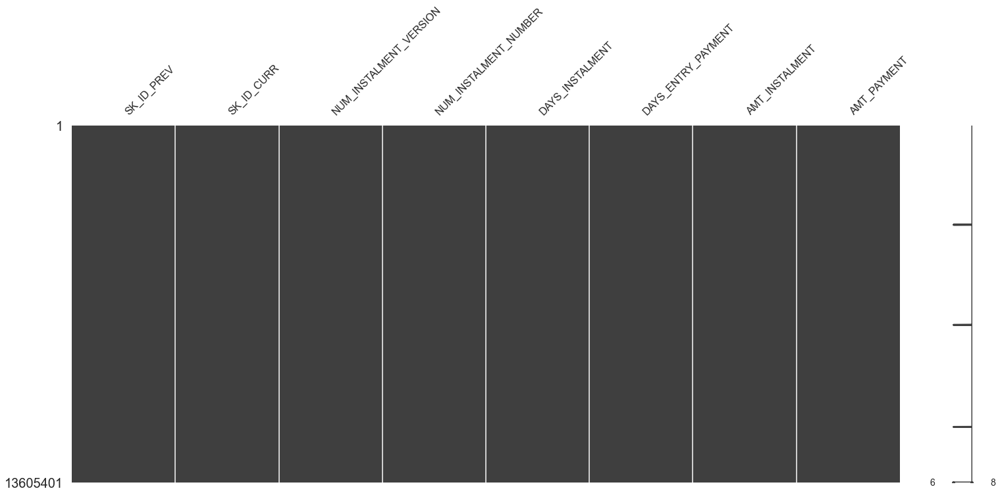

In [66]:
msno.matrix(df_installments_payments)

### Cleaning

In [67]:
#

### Features engineering

In [68]:
# percentage and difference paid in each installment (amount paid and installment value)
df_installments_payments['PAYMENT_PERC'] = df_installments_payments['AMT_PAYMENT'] / df_installments_payments['AMT_INSTALMENT']
df_installments_payments['PAYMENT_DIFF'] = df_installments_payments['AMT_INSTALMENT'] - df_installments_payments['AMT_PAYMENT']

# days past due and days before due (no negative values)
df_installments_payments['DPD'] = df_installments_payments['DAYS_ENTRY_PAYMENT'] - df_installments_payments['DAYS_INSTALMENT']
df_installments_payments['DBD'] = df_installments_payments['DAYS_INSTALMENT'] - df_installments_payments['DAYS_ENTRY_PAYMENT']

df_installments_payments['DPD'] = df_installments_payments['DPD'].apply(lambda x: x if x > 0 else 0)
df_installments_payments['DBD'] = df_installments_payments['DBD'].apply(lambda x: x if x > 0 else 0)

# numerical
aggregations = {
    'NUM_INSTALMENT_VERSION': ['nunique'],
    'DPD': ['max', 'mean', 'sum'],
    'DBD': ['max', 'mean', 'sum'],
    'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
    'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
    'AMT_INSTALMENT': ['max', 'mean', 'sum'],
    'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
    'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
}

'''# categorical
for cat in df_installments_payments.select_dtypes('object').columns.tolist():
    aggregations[cat] = ['mean']'''
    
# aggregation
df_installments_payments_agg = (df_installments_payments.groupby('SK_ID_CURR')
                                                        .agg(aggregations)
                               )

# rename columns
df_installments_payments_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in df_installments_payments_agg.columns.tolist()])

# count installments accounts
df_installments_payments_agg['INSTAL_COUNT'] = df_installments_payments.groupby('SK_ID_CURR').size()

# overview
info(df_installments_payments_agg)
df_installments_payments_agg.head()

26 columns
339587 rows
Rate of missing values : 0.02369393953877459 %



,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,
100001,2,11.0,1.571429,11.0,36.0,8.857143,62.0,1.0,1.0,7.0,0.0,0.0,0.0,0.0,0.0,17397.900,5885.132143,41195.925,3951.000,17397.900,5885.132143,41195.925,-1628.0,-2195.000000,-15365.0,7
100002,2,0.0,0.000000,0.0,31.0,20.421053,388.0,1.0,1.0,19.0,0.0,0.0,0.0,0.0,0.0,53093.745,11559.247105,219625.695,9251.775,53093.745,11559.247105,219625.695,-49.0,-315.421053,-5993.0,19
100003,2,0.0,0.000000,0.0,14.0,7.160000,179.0,1.0,1.0,25.0,0.0,0.0,0.0,0.0,0.0,560835.360,64754.586000,1618864.650,6662.970,560835.360,64754.586000,1618864.650,-544.0,-1385.320000,-34633.0,25
100004,2,0.0,0.000000,0.0,11.0,7.666667,23.0,1.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,10573.965,7096.155000,21288.465,5357.250,10573.965,7096.155000,21288.465,-727.0,-761.666667,-2285.0,3
100005,2,1.0,0.111111,1.0,37.0,23.666667,213.0,1.0,1.0,9.0,0.0,0.0,0.0,0.0,0.0,17656.245,6240.205000,56161.845,4813.200,17656.245,6240.205000,56161.845,-470.0,-609.555556,-5486.0,9


In [69]:
'''# pandas_profiling
profile_installments_payments = ProfileReport(df_installments_payments, title="installments_payments")
profile_installments_payments.to_notebook_iframe()'''

'# pandas_profiling\nprofile_installments_payments = ProfileReport(df_installments_payments, title="installments_payments")\nprofile_installments_payments.to_notebook_iframe()'

## df_POS_CASH_balance

### Initial analysis

In [70]:
# Overview
info(df_POS_CASH_balance)
df_POS_CASH_balance.head()

8 columns
10001358 rows
Rate of missing values : 0.06518864738168557 %



,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [71]:
df_POS_CASH_balance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB


In [72]:
# CAST
list_to_cast = ['SK_ID_PREV','SK_ID_CURR']

# Cast non-computable numerical variables as strings
df_POS_CASH_balance[list_to_cast] = df_POS_CASH_balance[list_to_cast].astype(str)

In [73]:
df_POS_CASH_balance.describe(include='all')

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
count,10001358,10001358,1.000136e+07,9.975287e+06,9.975271e+06,10001358,1.000136e+07,1.000136e+07
unique,936325,337252,NaN,NaN,NaN,9,NaN,NaN
top,1856103,265042,NaN,NaN,NaN,Active,NaN,NaN
freq,96,295,NaN,NaN,NaN,9151119,NaN,NaN
mean,NaN,NaN,-3.501259e+01,1.708965e+01,1.048384e+01,NaN,1.160693e+01,6.544684e-01
std,NaN,NaN,2.606657e+01,1.199506e+01,1.110906e+01,NaN,1.327140e+02,3.276249e+01
min,NaN,NaN,-9.600000e+01,1.000000e+00,0.000000e+00,NaN,0.000000e+00,0.000000e+00
25%,NaN,NaN,-5.400000e+01,1.000000e+01,3.000000e+00,NaN,0.000000e+00,0.000000e+00
50%,NaN,NaN,-2.800000e+01,1.200000e+01,7.000000e+00,NaN,0.000000e+00,0.000000e+00
75%,NaN,NaN,-1.300000e+01,2.400000e+01,1.400000e+01,NaN,0.000000e+00,0.000000e+00


<AxesSubplot:>

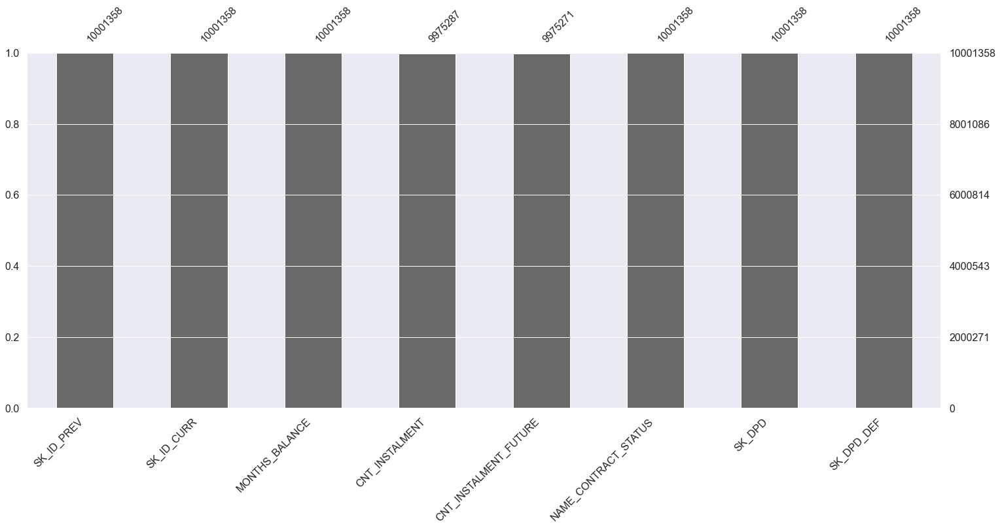

In [74]:
msno.bar(df_POS_CASH_balance)

### Cleaning

In [75]:
'''df_POS_CASH_balance = df_POS_CASH_balance.dropna(axis=1, how='any')
df_POS_CASH_balance.head()'''

"df_POS_CASH_balance = df_POS_CASH_balance.dropna(axis=1, how='any')\ndf_POS_CASH_balance.head()"

In [76]:
#msno.bar(df_POS_CASH_balance)

### Features engineering

In [77]:
# numerical
aggregations = {
    'MONTHS_BALANCE': ['max', 'mean', 'size'],
    'SK_DPD': ['max', 'mean'],
    'SK_DPD_DEF': ['max', 'mean']
}

'''# categorial
for cat in df_POS_CASH_balance.select_dtypes('object').columns.tolist():
    aggregations[cat] = ['mean']'''

# aggregation
df_POS_CASH_balance_agg = (df_POS_CASH_balance.groupby('SK_ID_CURR')
                                              .agg(aggregations)
                          )

# rename columns
df_POS_CASH_balance_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in df_POS_CASH_balance_agg.columns.tolist()])

# count pos cash accounts
df_POS_CASH_balance_agg['POS_COUNT'] = df_POS_CASH_balance.groupby('SK_ID_CURR').size()

# Overview
info(df_POS_CASH_balance_agg)
df_POS_CASH_balance_agg.head()

8 columns
337252 rows
Rate of missing values : 0.0 %



,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_COUNT
SK_ID_CURR,,,,,,,,
100001,-53,-72.555556,9,7,0.777778,7,0.777778,9
100002,-1,-10.000000,19,0,0.000000,0,0.000000,19
100003,-18,-43.785714,28,0,0.000000,0,0.000000,28
100004,-24,-25.500000,4,0,0.000000,0,0.000000,4
100005,-15,-20.000000,11,0,0.000000,0,0.000000,11


In [78]:
'''# pandas_profiling
profile_POS_CASH_balance = ProfileReport(df_POS_CASH_balance, title="POS_CASH_balance")
profile_POS_CASH_balance.to_notebook_iframe()'''

'# pandas_profiling\nprofile_POS_CASH_balance = ProfileReport(df_POS_CASH_balance, title="POS_CASH_balance")\nprofile_POS_CASH_balance.to_notebook_iframe()'

## df_previous_application

### Initial analysis

In [79]:
# Overview
info(df_previous_application)
df_previous_application.head()

37 columns
1670214 rows
Rate of missing values : 17.976877473444976 %



,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [80]:
df_previous_application.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [81]:
# CAST
list_to_cast = ['SK_ID_PREV','SK_ID_CURR']

# Cast non-computable numerical variables as string
df_previous_application[list_to_cast] = df_previous_application[list_to_cast].astype(str)

In [82]:
df_previous_application.describe(include='all')

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1670214,1670214,1670214,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1670214,1.670214e+06,1670214,1.670214e+06,774370.000000,5951.000000,5951.000000,1670214,1670214,1.670214e+06,1670214,1670214,849809,1670214,1670214,1670214,1670214,1670214,1.670214e+06,1670214,1.297984e+06,1670214,1669868,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
unique,1670214,338857,4,NaN,NaN,NaN,NaN,NaN,7,NaN,2,NaN,NaN,NaN,NaN,25,4,NaN,4,9,7,4,28,5,3,8,NaN,11,NaN,5,17,NaN,NaN,NaN,NaN,NaN,NaN
top,2030495,187868,Cash loans,NaN,NaN,NaN,NaN,NaN,TUESDAY,NaN,Y,NaN,NaN,NaN,NaN,XAP,Approved,NaN,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,POS,XNA,Credit and cash offices,NaN,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,77,747553,NaN,NaN,NaN,NaN,NaN,255118,NaN,1661739,NaN,NaN,NaN,NaN,922661,1036781,NaN,1033552,1353093,508970,1231261,950809,691011,1063666,719968,NaN,855720,NaN,517215,285990,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,NaN,1.248418e+01,NaN,9.964675e-01,0.079637,0.188357,0.773503,NaN,NaN,-8.806797e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.139511e+02,NaN,1.605408e+01,NaN,NaN,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,NaN,NaN,NaN,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,NaN,3.334028e+00,NaN,5.932963e-02,0.107823,0.087671,0.100879,NaN,NaN,7.790997e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.127443e+03,NaN,1.456729e+01,NaN,NaN,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,NaN,NaN,NaN,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,NaN,0.000000e+00,NaN,0.000000e+00,-0.000015,0.034781,0.373150,NaN,NaN,-2.922000e+03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.000000e+00,NaN,0.000000e+00,NaN,NaN,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,NaN,NaN,NaN,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,NaN,1.000000e+01,NaN,1.000000e+00,0.000000,0.160716,0.715645,NaN,NaN,-1.300000e+03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.000000e+00,NaN,6.000000e+00,NaN,NaN,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,NaN,NaN,NaN,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,NaN,1.200000e+01,NaN,1.000000e+00,0.051605,0.189122,0.835095,NaN,NaN,-5.810000e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.000000e+00,NaN,1.200000e+01,NaN,NaN,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,NaN,NaN,NaN,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,NaN,1.500000e+01,NaN,1.000000e+00,0.108909,0.193330,0.852537,NaN,NaN,-2.800000e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.200000e+01,NaN,2.400000e+01,NaN,NaN,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000


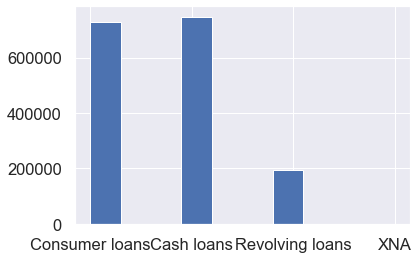

In [83]:
df_previous_application['NAME_CONTRACT_TYPE'].hist()
plt.show()

<AxesSubplot:>

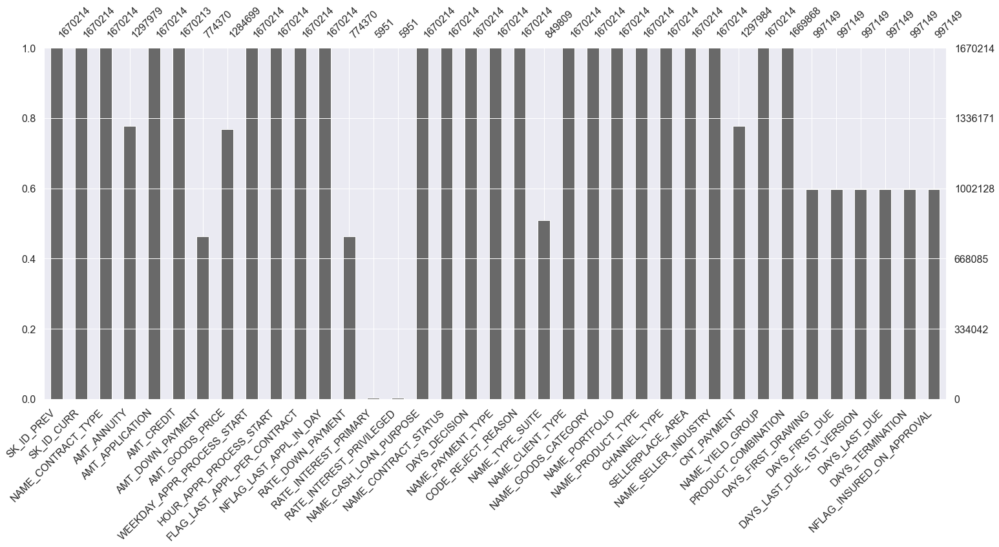

In [84]:
msno.bar(df_previous_application)

### Cleaning

In [85]:
#
df_previous_application = df_previous_application.dropna(axis=1, how='all')

# Days 365.243 values -> nan
df_previous_application['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
df_previous_application['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
df_previous_application['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
df_previous_application['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
df_previous_application['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)


### Features engineering

In [86]:
# Add feature: value ask / value received percentage
df_previous_application['APP_CREDIT_PERC'] = df_previous_application['AMT_APPLICATION'] / df_previous_application['AMT_CREDIT']

# numerical 
num_aggregations = {
    'AMT_ANNUITY': ['min', 'max', 'mean'],
    'AMT_APPLICATION': ['min', 'max', 'mean'],
    'AMT_CREDIT': ['min', 'max', 'mean'],
    'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
    'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
    'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
    'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
    'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
    'DAYS_DECISION': ['min', 'max', 'mean'],
    'CNT_PAYMENT': ['mean', 'sum'],
}

# categorical 
cat_aggregations = {}
'''for cat in df_previous_application.select_dtypes('object').columns.tolist():
    cat_aggregations[cat] = ['mean']'''
    
# aggregation
df_previous_application_agg = df_previous_application.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})

# rename columns
df_previous_application_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in df_previous_application_agg.columns.tolist()])

# previous applications: approved applications - only numerical features
approved = df_previous_application[df_previous_application['NAME_CONTRACT_STATUS'] == 1]
approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
df_previous_application_agg = df_previous_application_agg.join(approved_agg, how='left', on='SK_ID_CURR')

# previous applications: refused applications - only numerical features
refused = df_previous_application[df_previous_application['NAME_CONTRACT_STATUS'] == 1]
refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
df_previous_application_agg = df_previous_application_agg.join(refused_agg, how='left', on='SK_ID_CURR')

# overview
info(df_previous_application_agg)
df_previous_application_agg.head()

90 columns
338857 rows
Rate of missing values : 67.3143571214734 %



,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,APPROVED_AMT_ANNUITY_MIN,APPROVED_AMT_ANNUITY_MAX,APPROVED_AMT_ANNUITY_MEAN,APPROVED_AMT_APPLICATION_MIN,APPROVED_AMT_APPLICATION_MAX,APPROVED_AMT_APPLICATION_MEAN,APPROVED_AMT_CREDIT_MIN,APPROVED_AMT_CREDIT_MAX,APPROVED_AMT_CREDIT_MEAN,APPROVED_APP_CREDIT_PERC_MIN,APPROVED_APP_CREDIT_PERC_MAX,APPROVED_APP_CREDIT_PERC_MEAN,APPROVED_APP_CREDIT_PERC_VAR,APPROVED_AMT_DOWN_PAYMENT_MIN,APPROVED_AMT_DOWN_PAYMENT_MAX,APPROVED_AMT_DOWN_PAYMENT_MEAN,APPROVED_AMT_GOODS_PRICE_MIN,APPROVED_AMT_GOODS_PRICE_MAX,APPROVED_AMT_GOODS_PRICE_MEAN,APPROVED_HOUR_APPR_PROCESS_START_MIN,APPROVED_HOUR_APPR_PROCESS_START_MAX,APPROVED_HOUR_APPR_PROCESS_START_MEAN,APPROVED_RATE_DOWN_PAYMENT_MIN,APPROVED_RATE_DOWN_PAYMENT_MAX,APPROVED_RATE_DOWN_PAYMENT_MEAN,APPROVED_DAYS_DECISION_MIN,APPROVED_DAYS_DECISION_MAX,APPROVED_DAYS_DECISION_MEAN,APPROVED_CNT_PAYMENT_MEAN,APPROVED_CNT_PAYMENT_SUM,REFUSED_AMT_ANNUITY_MIN,REFUSED_AMT_ANNUITY_MAX,REFUSED_AMT_ANNUITY_MEAN,REFUSED_AMT_APPLICATION_MIN,REFUSED_AMT_APPLICATION_MAX,REFUSED_AMT_APPLICATION_MEAN,REFUSED_AMT_CREDIT_MIN,REFUSED_AMT_CREDIT_MAX,REFUSED_AMT_CREDIT_MEAN,REFUSED_APP_CREDIT_PERC_MIN,REFUSED_APP_CREDIT_PERC_MAX,REFUSED_APP_CREDIT_PERC_MEAN,REFUSED_APP_CREDIT_PERC_VAR,REFUSED_AMT_DOWN_PAYMENT_MIN,REFUSED_AMT_DOWN_PAYMENT_MAX,REFUSED_AMT_DOWN_PAYMENT_MEAN,REFUSED_AMT_GOODS_PRICE_MIN,REFUSED_AMT_GOODS_PRICE_MAX,REFUSED_AMT_GOODS_PRICE_MEAN,REFUSED_HOUR_APPR_PROCESS_START_MIN,REFUSED_HOUR_APPR_PROCESS_START_MAX,REFUSED_HOUR_APPR_PROCESS_START_MEAN,REFUSED_RATE_DOWN_PAYMENT_MIN,REFUSED_RATE_DOWN_PAYMENT_MAX,REFUSED_RATE_DOWN_PAYMENT_MEAN,REFUSED_DAYS_DECISION_MIN,REFUSED_DAYS_DECISION_MAX,REFUSED_DAYS_DECISION_MEAN,REFUSED_CNT_PAYMENT_MEAN,REFUSED_CNT_PAYMENT_SUM
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100001,3951.000,3951.000,3951.000,24835.5,24835.5,24835.50,23787.0,23787.0,23787.00,1.044079,1.044079,1.044079,NaN,2520.0,2520.0,2520.0,24835.5,24835.5,24835.5,13,13,13.000000,0.104326,0.104326,0.104326,-1740,-1740,-1740.0,8.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100002,9251.775,9251.775,9251.775,179055.0,179055.0,179055.00,179055.0,179055.0,179055.00,1.000000,1.000000,1.000000,NaN,0.0,0.0,0.0,179055.0,179055.0,179055.0,9,9,9.000000,0.000000,0.000000,0.000000,-606,-606,-606.0,24.0,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100003,6737.310,98356.995,56553.990,68809.5,900000.0,435436.50,68053.5,1035882.0,484191.00,0.868825,1.011109,0.949329,0.005324,0.0,6885.0,3442.5,68809.5,900000.0,435436.5,12,17,14.666667,0.000000,0.100061,0.050030,-2341,-746,-1305.0,10.0,30.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100004,5357

In [87]:
'''# pandas_profiling
profile_previous_application = ProfileReport(df_previous_application, title="previous_application")
profile_previous_application.to_notebook_iframe()'''

'# pandas_profiling\nprofile_previous_application = ProfileReport(df_previous_application, title="previous_application")\nprofile_previous_application.to_notebook_iframe()'

## df_sample_submission

In [88]:
'''# Overview
info(df_sample_submission)
df_sample_submission.head()'''

'# Overview\ninfo(df_sample_submission)\ndf_sample_submission.head()'

In [89]:
'''df_sample_submission.info()'''

'df_sample_submission.info()'

In [90]:
'''# CAST
list_to_cast = ['SK_ID_CURR']

# Cast non-computable numerical variables as strings
df_sample_submission[list_to_cast] = df_sample_submission[list_to_cast].astype(str)'''

"# CAST\nlist_to_cast = ['SK_ID_CURR']\n\n# Cast non-computable numerical variables as strings\ndf_sample_submission[list_to_cast] = df_sample_submission[list_to_cast].astype(str)"

In [91]:
'''df_sample_submission.describe(include='all')'''

"df_sample_submission.describe(include='all')"

In [92]:
'''# pandas_profiling
profile_sample_submission = ProfileReport(df_sample_submission, title="sample_submission")
profile_sample_submission.to_notebook_iframe()'''

'# pandas_profiling\nprofile_sample_submission = ProfileReport(df_sample_submission, title="sample_submission")\nprofile_sample_submission.to_notebook_iframe()'

## df_HomeCredit_columns_description

In [93]:
# Overview
info(df_HomeCredit_columns_description)
df_HomeCredit_columns_description.head()

5 columns
219 rows
Rate of missing values : 12.146118721461189 %



,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment difficulties: he/she had late payment more than X days ...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN


In [141]:
df_HomeCredit_columns_description[df_HomeCredit_columns_description.Row == "AMT_GOODS_PRICE"]

,Unnamed: 0,Table,Row,Description,Special
10,13,application_{train|test}.csv,AMT_GOODS_PRICE,For consumer loans it is the price of the goods for which the loan is given,NaN
180,183,previous_application.csv,AMT_GOODS_PRICE,Goods price of good that client asked for (if applicable) on the previous application,NaN


# Merge 

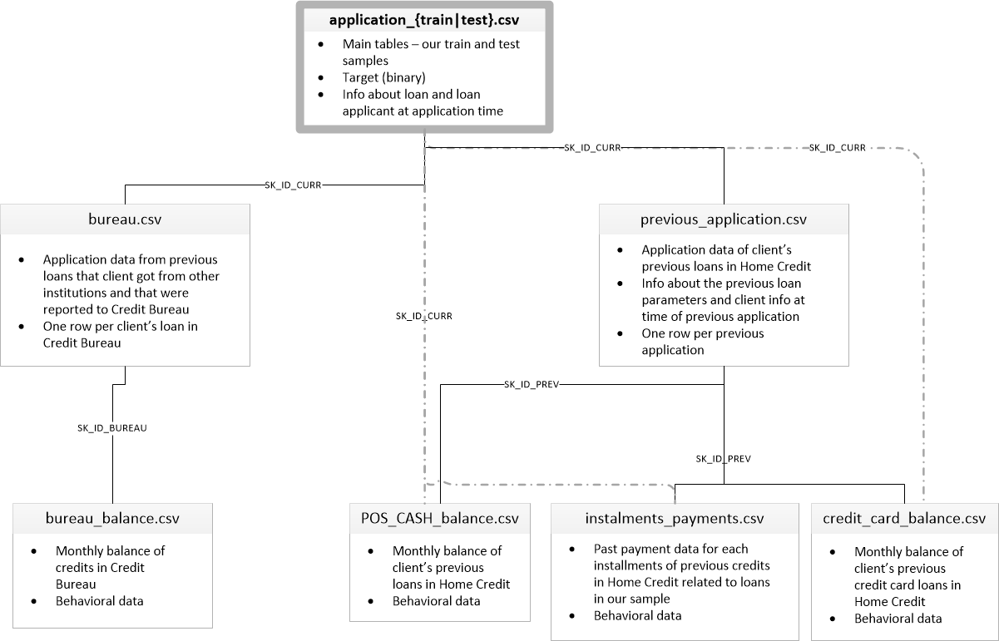

In [95]:
#
display.Image("./img/home_credit_default_risk_database.png")


In [96]:
#
info(df_application_test_train)
df_application_test_train.head()

129 columns
356251 rows
Rate of missing values : 23.42463926498648 %



,index,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
0,0,100002,1.0,Cash loans,0,0,0,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637.0,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,False,0.067329,0.498036,202500.0,0.121978,0.060749
1,1,100003,0.0,Cash loans,1,0,1,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188.0,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False,0.070862,0.208736,135000.0,0.132217,0.027598
2,2,100004,0.0,Revolving loans,0,1,0,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046

In [97]:
# rename AMT_ANNUITY
df_bureau = df_bureau.rename(columns={'AMT_ANNUITY':'AMT_ANNUITY_CREDIT'})

#
info(df_bureau)
df_bureau.head()

20 columns
1716428 rows
Rate of missing values : 19.71002861757091 %



,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY_CREDIT,MONTHS_BALANCE_MIN,MONTHS_BALANCE_MAX,MONTHS_BALANCE_SIZE
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN,NaN,NaN,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN,NaN,NaN,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN,NaN,NaN,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN,NaN,NaN,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN,NaN,NaN,NaN


In [98]:
n_rows = (307507)

df_application_test_train_merge = df_application_test_train.head(n_rows)
df_bureau_agg_merge = df_bureau_agg.head(n_rows)
df_previous_application_agg_merge = df_previous_application_agg.head(n_rows)
df_POS_CASH_balance_agg_merge = df_POS_CASH_balance_agg.head(n_rows)
df_installments_payments_agg_merge = df_installments_payments_agg.head(n_rows)
df_credit_card_balance_agg_merge = df_credit_card_balance_agg.head(n_rows)

In [99]:
# merge
df_merge = (df_application_test_train_merge.join(df_bureau_agg_merge, 
                                                 how='left', 
                                                 on='SK_ID_CURR')
                                           .join(df_previous_application_agg_merge, 
                                                 how='left', 
                                                 on='SK_ID_CURR')
                                           .join(df_POS_CASH_balance_agg_merge, 
                                                 how='left', 
                                                 on='SK_ID_CURR')
                                           .join(df_installments_payments_agg_merge, 
                                                 how='left', 
                                                 on='SK_ID_CURR')
                                           .join(df_credit_card_balance_agg_merge, 
                                                 how='left', 
                                                 on='SK_ID_CURR'))

# change index
df_merge = df_merge.drop(columns={'index'}).set_index('SK_ID_CURR')

# overview
info(df_merge)
df_merge.head()

433 columns
307507 rows
Rate of missing values : 54.44769048649174 %



,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_AMT_CREDIT_MAX_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_ANNUITY_MAX,BURO_AMT_ANNUITY_MEAN,BURO_CNT_CREDIT_PROLONG_SUM,BURO_MONTHS_BALANCE_MIN_MIN,BURO_MONTHS_BALANCE_MAX_MAX,BURO_MONTHS_BALANCE_SIZE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,ACTIVE_DAYS_CREDIT_MIN,ACTIVE_DAYS_CREDIT_MAX,ACTIVE_DAYS_CREDIT_MEAN,ACTIVE_DAYS_CREDIT_VAR,ACTIVE_DAYS_CREDIT_ENDDATE_MIN,ACTIVE_DAYS_CREDIT_ENDDATE_MAX,ACTIVE_DAYS_CREDIT_ENDDATE_MEAN,ACTIVE_DAYS_CREDIT_UPDATE_MEAN,ACTIVE_CREDIT_DAY_OVERDUE_MAX,ACTIVE_CREDIT_DAY_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_MAX_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_SUM_MAX,ACTIVE_AMT_CREDIT_SUM_MEAN,ACTIVE_AMT_CREDIT_SUM_SUM,ACTIVE_AMT_CREDIT_SUM_DEBT_MAX,ACTIVE_AMT_CREDIT_SUM_DEBT_MEAN,ACTIVE_AMT_CREDIT_SUM_DEBT_SUM,ACTIVE_AMT_CREDIT_SUM_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_SUM_LIMIT_MEAN,ACTIVE_AMT_CREDIT_SUM_LIMIT_SUM,ACTIVE_AMT_ANNUITY_MAX,ACTIVE_AMT_ANNUITY_MEAN,ACTIVE_CNT_CREDIT_PROLONG_SUM,ACTIVE_MONTHS_BALANCE_MIN_MIN,ACTIVE_MONTHS_BALANCE_MAX_MAX,ACTIVE_MONTHS_BALANCE_SIZE_MEAN,ACTIVE_MONTHS_BALANCE_SIZE_SUM,CLOSED_DAYS_CREDIT_MIN,CLOSED_DAYS_CREDIT_MAX,CLOSED_DAYS_CREDIT_MEAN,CLOSED_DAYS_CREDIT_VAR,CLOSED_DAYS_CREDIT_ENDDATE_MIN,CLOSED_DAYS_CREDIT_ENDDATE_MAX,CLOSED_DAYS_CREDIT_ENDDATE

In [100]:
# variables' types
df_merge.info()

<class 'pandas.core.frame.DataFrame'>
Index: 307507 entries, 100002 to 456255
Columns: 433 entries, TARGET to CC_COUNT
dtypes: float64(378), int64(41), object(14)
memory usage: 1018.2+ MB


In [101]:
# variables' stats
df_merge.describe(include='all')

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_ANOM,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_AMT_CREDIT_MAX_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_AMT_ANNUITY_MAX,BURO_AMT_ANNUITY_MEAN,BURO_CNT_CREDIT_PROLONG_SUM,BURO_MONTHS_BALANCE_MIN_MIN,BURO_MONTHS_BALANCE_MAX_MAX,BURO_MONTHS_BALANCE_SIZE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,ACTIVE_DAYS_CREDIT_MIN,ACTIVE_DAYS_CREDIT_MAX,ACTIVE_DAYS_CREDIT_MEAN,ACTIVE_DAYS_CREDIT_VAR,ACTIVE_DAYS_CREDIT_ENDDATE_MIN,ACTIVE_DAYS_CREDIT_ENDDATE_MAX,ACTIVE_DAYS_CREDIT_ENDDATE_MEAN,ACTIVE_DAYS_CREDIT_UPDATE_MEAN,ACTIVE_CREDIT_DAY_OVERDUE_MAX,ACTIVE_CREDIT_DAY_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_MAX_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_SUM_MAX,ACTIVE_AMT_CREDIT_SUM_MEAN,ACTIVE_AMT_CREDIT_SUM_SUM,ACTIVE_AMT_CREDIT_SUM_DEBT_MAX,ACTIVE_AMT_CREDIT_SUM_DEBT_MEAN,ACTIVE_AMT_CREDIT_SUM_DEBT_SUM,ACTIVE_AMT_CREDIT_SUM_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_SUM_LIMIT_MEAN,ACTIVE_AMT_CREDIT_SUM_LIMIT_SUM,ACTIVE_AMT_ANNUITY_MAX,ACTIVE_AMT_ANNUITY_MEAN,ACTIVE_CNT_CREDIT_PROLONG_SUM,ACTIVE_MONTHS_BALANCE_MIN_MIN,ACTIVE_MONTHS_BALANCE_MAX_MAX,ACTIVE_MONTHS_BALANCE_SIZE_MEAN,ACTIVE_MONTHS_BALANCE_SIZE_SUM,CLOSED_DAYS_CREDIT_MIN,CLOSED_DAYS_CREDIT_MAX,CLOSED_DAYS_CREDIT_MEAN,CLOSED_DAYS_CREDIT_VAR,CLOSED_DAYS_CREDIT_ENDDATE_MIN,CLOSED_DAYS_CREDIT_ENDDATE_MAX,CLOSED_DAYS_CREDIT_ENDDATE

<AxesSubplot:>

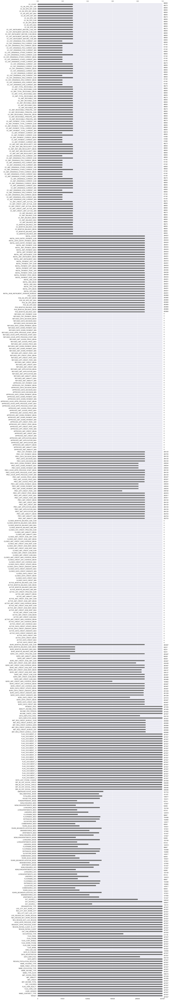

In [102]:
# missing values
msno.bar(df_merge)

## Cleaning

In [143]:
df_merge.rows()

AttributeError: 'DataFrame' object has no attribute 'rows'

In [145]:
#
df_merge['OCCUPATION_TYPE'] = df_merge['OCCUPATION_TYPE'].fillna('NA')

# deleting columns populated below 80% 
for col in df_merge.columns:
    if df_merge[col].isnull().mean() >= 0.20:
        df_merge = df_merge.drop(columns={col})

# deleting uncomplete rows
df_merge = df_merge.dropna(axis=0, how='any')

# overview
info(df_merge)
df_merge.head()

TypeError: Cannot index by location index with a non-integer key

In [104]:
# variables to cast
list_variables_to_cast = ["CODE_GENDER",
                          "FLAG_OWN_CAR",
                          "FLAG_OWN_REALTY",
                          "FLAG_MOBIL",
                          "FLAG_EMP_PHONE",
                          "FLAG_WORK_PHONE",
                          "FLAG_CONT_MOBILE",
                          "FLAG_PHONE",
                          "FLAG_EMAIL",
                          "FLAG_DOCUMENT_2",
                          "FLAG_DOCUMENT_3",
                          "FLAG_DOCUMENT_4",
                          "FLAG_DOCUMENT_5",
                          "FLAG_DOCUMENT_6",
                          "FLAG_DOCUMENT_7",
                          "FLAG_DOCUMENT_8",
                          "FLAG_DOCUMENT_9",
                          "FLAG_DOCUMENT_10",
                          "FLAG_DOCUMENT_11",
                          "FLAG_DOCUMENT_12",
                          "FLAG_DOCUMENT_13",
                          "FLAG_DOCUMENT_14",
                          "FLAG_DOCUMENT_15",
                          "FLAG_DOCUMENT_16",
                          "FLAG_DOCUMENT_17",
                          "FLAG_DOCUMENT_18",
                          "FLAG_DOCUMENT_19",
                          "FLAG_DOCUMENT_20",
                          "FLAG_DOCUMENT_21"
                         ]   

# casting non-computable numerical variables as strings
df_merge[list_variables_to_cast] = df_merge[list_variables_to_cast].astype(str)
        
#        
df_merge = df_merge.drop(columns={"DAYS_EMPLOYED_ANOM"}) #boolean
        
# overview
info(df_merge)
df_merge.head()

159 columns
157129 rows
Rate of missing values : 0.0 %



,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_MONTHS_BALANCE_SIZE_SUM,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_COUNT,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1.0,Cash loans,0,0,0,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637.0,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.067329,0.498036,202500.0,0.1219

In [105]:
# variables types
df_merge.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 157129 entries, 100002 to 422876
Data columns (total 159 columns):
 #    Column                                 Dtype  
---   ------                                 -----  
 0    TARGET                                 float64
 1    NAME_CONTRACT_TYPE                     object 
 2    CODE_GENDER                            object 
 3    FLAG_OWN_CAR                           object 
 4    FLAG_OWN_REALTY                        object 
 5    CNT_CHILDREN                           int64  
 6    AMT_INCOME_TOTAL                       float64
 7    AMT_CREDIT                             float64
 8    AMT_ANNUITY                            float64
 9    AMT_GOODS_PRICE                        float64
 10   NAME_TYPE_SUITE                        object 
 11   NAME_INCOME_TYPE                       object 
 12   NAME_EDUCATION_TYPE                    object 
 13   NAME_FAMILY_STATUS                     object 
 14   NAME_HOUSING_TYPE                 

<AxesSubplot:>

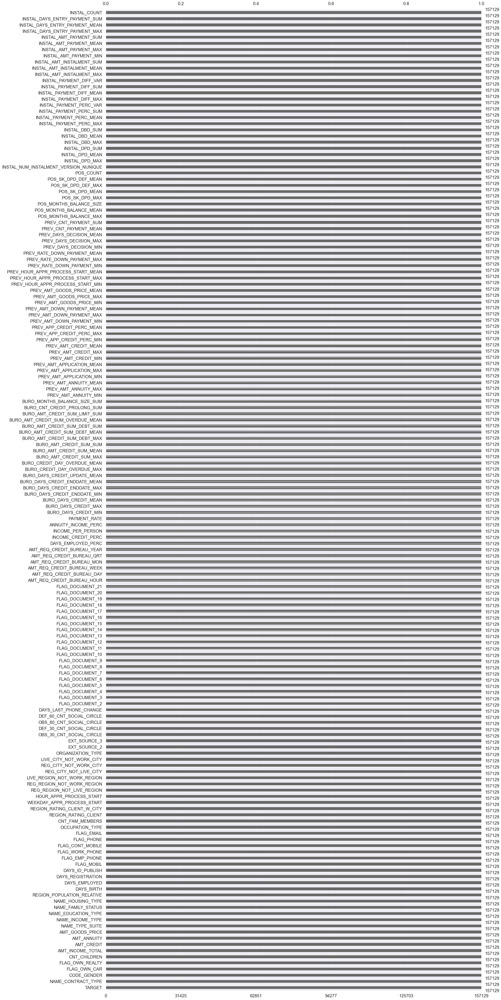

In [106]:
# missing values
msno.bar(df_merge)

In [107]:
# variables selection
#
df_merge_select = df_merge[["TARGET",                                 
                             "NAME_CONTRACT_TYPE", 
                             "OCCUPATION_TYPE",
                             "CODE_GENDER",                            
                             "FLAG_OWN_CAR",                            
                             "FLAG_OWN_REALTY",                         
                             "CNT_CHILDREN",                             
                             "AMT_INCOME_TOTAL",                       
                             "AMT_CREDIT",                             
                             "AMT_ANNUITY",                            
                             "AMT_GOODS_PRICE",                        
                             #"NAME_TYPE_SUITE",                         
                             "NAME_INCOME_TYPE",                        
                             "NAME_EDUCATION_TYPE",                     
                             "NAME_FAMILY_STATUS",                      
                             "NAME_HOUSING_TYPE",                       
                             #"REGION_POPULATION_RELATIVE",             
                             "DAYS_BIRTH",                               
                             "DAYS_EMPLOYED",                          
                             "DAYS_REGISTRATION",                      
                             #"DAYS_ID_PUBLISH",                          
                             "FLAG_MOBIL",                              
                             "FLAG_EMP_PHONE",                          
                             "FLAG_WORK_PHONE",                         
                             "FLAG_CONT_MOBILE",                        
                             "FLAG_PHONE",                              
                             #"FLAG_EMAIL",                              
                             "CNT_FAM_MEMBERS",                        
                             #"REGION_RATING_CLIENT",                     
                             #"REGION_RATING_CLIENT_W_CITY",              
                             #"WEEKDAY_APPR_PROCESS_START",             
                             #"HOUR_APPR_PROCESS_START",                  
                             #"REG_REGION_NOT_LIVE_REGION",               
                             #"REG_REGION_NOT_WORK_REGION",               
                             #"LIVE_REGION_NOT_WORK_REGION",              
                             #"REG_CITY_NOT_LIVE_CITY",                   
                             #"REG_CITY_NOT_WORK_CITY",                   
                             #"LIVE_CITY_NOT_WORK_CITY",                  
                             "ORGANIZATION_TYPE",                       
                             #"EXT_SOURCE_2",                           
                             #"EXT_SOURCE_3",                           
                             #"OBS_30_CNT_SOCIAL_CIRCLE",               
                             #"DEF_30_CNT_SOCIAL_CIRCLE",               
                             #"OBS_60_CNT_SOCIAL_CIRCLE",               
                             #"DEF_60_CNT_SOCIAL_CIRCLE",               
                             #"DAYS_LAST_PHONE_CHANGE",                 
                             #"FLAG_DOCUMENT_2",                         
                             #"FLAG_DOCUMENT_3",                         
                             #"FLAG_DOCUMENT_4",                         
                             #"FLAG_DOCUMENT_5",                         
                             #"FLAG_DOCUMENT_6",                         
                             #"FLAG_DOCUMENT_7",                         
                             #"FLAG_DOCUMENT_8",                         
                             #"FLAG_DOCUMENT_9",                         
                             #"FLAG_DOCUMENT_10",                        
                             #"FLAG_DOCUMENT_11",                        
                             #"FLAG_DOCUMENT_12",                        
                             #"FLAG_DOCUMENT_13",                        
                             #"FLAG_DOCUMENT_14",                        
                             #"FLAG_DOCUMENT_15",                        
                             #"FLAG_DOCUMENT_16",                        
                             #"FLAG_DOCUMENT_17",                        
                             #"FLAG_DOCUMENT_18",                        
                             #"FLAG_DOCUMENT_19",                        
                             #"FLAG_DOCUMENT_20",                        
                             #"FLAG_DOCUMENT_21",                        
                             #"AMT_REQ_CREDIT_BUREAU_HOUR",             
                             #"AMT_REQ_CREDIT_BUREAU_DAY",              
                             #"AMT_REQ_CREDIT_BUREAU_WEEK",             
                             #"AMT_REQ_CREDIT_BUREAU_MON",              
                             #"AMT_REQ_CREDIT_BUREAU_QRT",              
                             #"AMT_REQ_CREDIT_BUREAU_YEAR",             
                             #"DAYS_EMPLOYED_PERC",                     
                             #"INCOME_CREDIT_PERC",                     
                             #"INCOME_PER_PERSON",                      
                             #"ANNUITY_INCOME_PERC",                    
                             #"PAYMENT_RATE",                           
                             #"BURO_DAYS_CREDIT_MIN",                   
                             #"BURO_DAYS_CREDIT_MAX",                   
                             #"BURO_DAYS_CREDIT_MEAN",                  
                             #"BURO_DAYS_CREDIT_ENDDATE_MIN",           
                             #"BURO_DAYS_CREDIT_ENDDATE_MAX",           
                             #"BURO_DAYS_CREDIT_ENDDATE_MEAN",          
                             #"BURO_DAYS_CREDIT_UPDATE_MEAN",           
                             #"BURO_CREDIT_DAY_OVERDUE_MAX",            
                             #"BURO_CREDIT_DAY_OVERDUE_MEAN",           
                             #"BURO_AMT_CREDIT_SUM_MAX",                
                             #"BURO_AMT_CREDIT_SUM_MEAN",               
                             #"BURO_AMT_CREDIT_SUM_SUM",                
                             #"BURO_AMT_CREDIT_SUM_DEBT_MAX",           
                             #"BURO_AMT_CREDIT_SUM_DEBT_MEAN",          
                             #"BURO_AMT_CREDIT_SUM_DEBT_SUM",           
                             #"BURO_AMT_CREDIT_SUM_OVERDUE_MEAN",       
                             #"BURO_AMT_CREDIT_SUM_LIMIT_SUM",          
                             #"BURO_CNT_CREDIT_PROLONG_SUM",            
                             #"BURO_MONTHS_BALANCE_SIZE_SUM",           
                             #"PREV_AMT_ANNUITY_MIN",                   
                             #"PREV_AMT_ANNUITY_MAX",                   
                             #"PREV_AMT_ANNUITY_MEAN",                  
                             #"PREV_AMT_APPLICATION_MIN",               
                             #"PREV_AMT_APPLICATION_MAX",               
                             #"PREV_AMT_APPLICATION_MEAN",              
                             #"PREV_AMT_CREDIT_MIN",                    
                             #"PREV_AMT_CREDIT_MAX",                    
                             #"PREV_AMT_CREDIT_MEAN",                   
                             #"PREV_APP_CREDIT_PERC_MIN",               
                             #"PREV_APP_CREDIT_PERC_MAX",               
                             #"PREV_APP_CREDIT_PERC_MEAN",              
                             #"PREV_AMT_DOWN_PAYMENT_MIN",              
                             #"PREV_AMT_DOWN_PAYMENT_MAX",              
                             #"PREV_AMT_DOWN_PAYMENT_MEAN",             
                             #"PREV_AMT_GOODS_PRICE_MIN",               
                             #"PREV_AMT_GOODS_PRICE_MAX",               
                             #"PREV_AMT_GOODS_PRICE_MEAN",              
                             #"PREV_HOUR_APPR_PROCESS_START_MIN",       
                             #"PREV_HOUR_APPR_PROCESS_START_MAX",       
                             #"PREV_HOUR_APPR_PROCESS_START_MEAN",      
                             #"PREV_RATE_DOWN_PAYMENT_MIN",             
                             #"PREV_RATE_DOWN_PAYMENT_MAX",             
                             #"PREV_RATE_DOWN_PAYMENT_MEAN",            
                             #"PREV_DAYS_DECISION_MIN",                 
                             #"PREV_DAYS_DECISION_MAX",                 
                             #"PREV_DAYS_DECISION_MEAN",                
                             #"PREV_CNT_PAYMENT_MEAN",                  
                             #"PREV_CNT_PAYMENT_SUM",                   
                             #"POS_MONTHS_BALANCE_MAX",                 
                             #"POS_MONTHS_BALANCE_MEAN",                
                             #"POS_MONTHS_BALANCE_SIZE",                
                             #"POS_SK_DPD_MAX",                         
                             #"POS_SK_DPD_MEAN",                        
                             #"POS_SK_DPD_DEF_MAX",                     
                             #"POS_SK_DPD_DEF_MEAN",                    
                             #"POS_COUNT",                              
                             #"INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE",  
                             #"INSTAL_DPD_MAX",                         
                             #"INSTAL_DPD_MEAN",                        
                             #"INSTAL_DPD_SUM",                         
                             #"INSTAL_DBD_MAX",                         
                             #"INSTAL_DBD_MEAN",                        
                             #"INSTAL_DBD_SUM",                         
                             #"INSTAL_PAYMENT_PERC_MAX",                
                             #"INSTAL_PAYMENT_PERC_MEAN",               
                             #"INSTAL_PAYMENT_PERC_SUM",                
                             #"INSTAL_PAYMENT_PERC_VAR",                
                             #"INSTAL_PAYMENT_DIFF_MAX",                
                             #"INSTAL_PAYMENT_DIFF_MEAN",               
                             #"INSTAL_PAYMENT_DIFF_SUM",                
                             #"INSTAL_PAYMENT_DIFF_VAR",                
                             #"INSTAL_AMT_INSTALMENT_MAX",              
                             #"INSTAL_AMT_INSTALMENT_MEAN",             
                             #"INSTAL_AMT_INSTALMENT_SUM",              
                             #"INSTAL_AMT_PAYMENT_MIN",                 
                             #"INSTAL_AMT_PAYMENT_MAX",                 
                             #"INSTAL_AMT_PAYMENT_MEAN",                
                             #"INSTAL_AMT_PAYMENT_SUM",                 
                             #"INSTAL_DAYS_ENTRY_PAYMENT_MAX",          
                             #"INSTAL_DAYS_ENTRY_PAYMENT_MEAN",         
                             #"INSTAL_DAYS_ENTRY_PAYMENT_SUM",          
                             #"INSTAL_COUNT"                           
                            ]]

#
info(df_merge_select)
df_merge_select.head()

25 columns
157129 rows
Rate of missing values : 0.0 %



,TARGET,NAME_CONTRACT_TYPE,OCCUPATION_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,CNT_FAM_MEMBERS,ORGANIZATION_TYPE
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1.0,Cash loans,Laborers,0,0,0,0,202500.0,406597.5,24700.5,351000.0,Working,Secondary / secondary special,Single / not married,House / apartment,-9461,-637.0,-3648.0,1,1,0,1,1,1.0,Business Entity Type 3
100004,0.0,Revolving loans,Laborers,0,1,0,0,67500.0,135000.0,6750.0,135000.0,Working,Secondary / secondary special,Single / not married,House / apartment,-19046,-225.0,-4260.0,1,1,1,1,1,1.0,Government
100008,0.0,Cash loans,Laborers,0,0,0,0,99000.0,490495.5,27517.5,454500.0,State servant,Secondary / secondary special,Married,House / apartment,-16941,-1588.0,-4970.0,1,1,1,1,1,2.0,Other
100009,0.0,Cash loans,Accountants,1,1,0,1,171000.0,1560726.0,41301.0,1395000.0,Commercial associate,Higher education,Married,House / apartment,-13778,-3130.0,-1213.0,1,1,0,1,1,3.0,Business Entity Type 3
100010,0.0,Cash loans,Managers,0,1,0,0,360000.0,1530000.0,42075.0,1530000.0,State servant,Higher education,Married,House / apartment,-18850,-449.0,-4597.0,1,1,1,1,0,2.0,Other


<AxesSubplot:>

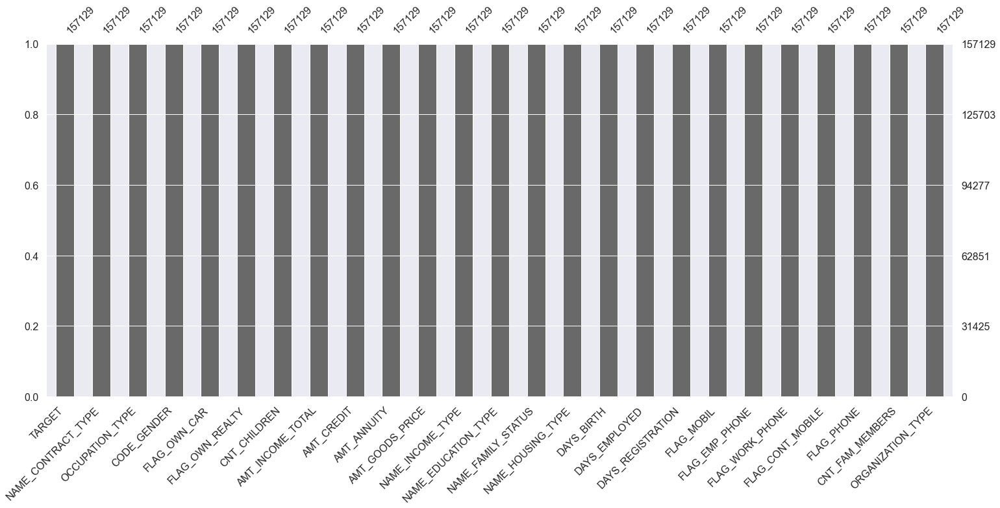

In [108]:
# Checking missing values
msno.bar(df_merge_select)

# Classification

In [109]:
STOP_

NameError: name 'STOP_' is not defined

## DummyClassifier (Baseline)

In [116]:
#
dummy_instance = ClassifierBestParamsSearch(dataframe=df_merge_select,
                                            numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), 
                                                                   StandardScaler()], 
                                            categorical_transformers=[SimpleImputer(fill_value="missing", strategy='constant'), 
                                                                     OneHotEncoder(handle_unknown="ignore")], 
                                            target='TARGET',
                                            classifier_type=DummyClassifier,
                                            score=fbeta_score,
                                            max_evals=1)

# hyperparameters optimization (hyperopt)
#dummy_best_params = dummy_instance.trials_classifier()

In [117]:
#
results_dummy = dummy_instance.executes_algo_function(best_params_dummy) 

* Imblearn:
y_train labels before resampling: Counter({0.0: 115251, 1.0: 10452})
y_train labels after resampling: Counter({0.0: 23050, 1.0: 23050})

* Stats:
roc_auc_score: 0.5
f1_score: 0.0
accuracy_score: 0.9168522879144657
recall_score: 0.0
precision_score: 0.0
fbeta_score: 0.0



### LIME

In [ ]:
#
dummy_instance.executes_algo_function_lime(best_params_dummy)

### SHAPE

In [ ]:
'''
# options: force, summary, embedding, dependence, decision, bar, waterfall 
dummy_instance.executes_algo_function_shap(best_params_dummy,
                                        53,
                                        100,
                                        "force",
                                        "",
                                        0)'''

### Learning curves

In [ ]:
# Visualize learning curves
title = r"Learning Curves DummyCLassifier after optimization (hyperopt)"
plot_learning_curve(results_dummy[1], 
                    title, 
                    results_dummy[2], 
                    results_dummy[3], 
                    results_dummy[4], 
                    results_dummy[5],
                    results_dummy[6],
                    cv=3
                   )


## LogisticRegression

In [121]:
lr_instance = ClassifierBestParamsSearch(dataframe=df_merge_select,
                                           numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), 
                                                                   StandardScaler()], 
                                           categorical_transformers=[SimpleImputer(fill_value="missing", strategy='constant'), 
                                                                     OneHotEncoder(handle_unknown="ignore")], 
                                           target='TARGET',
                                           classifier_type=LogisticRegression,
                                           score=fbeta_score,
                                           max_evals=100)
                                   
# hyperparameters optimization (hyperopt)
#lr_best_params = lr_instance.trials_classifier()

* Imblearn:
y_train labels before resampling: Counter({0.0: 115251, 1.0: 10452})
y_train labels after resampling: Counter({0.0: 23050, 1.0: 23050})

* Stats:
roc_auc_score: 0.5984337899523364
f1_score: 0.1929401906358018
accuracy_score: 0.5096416979571056
recall_score: 0.7049368541905855
precision_score: 0.11176506279958741
fbeta_score: 0.6697434309762007

* Feature Importance:


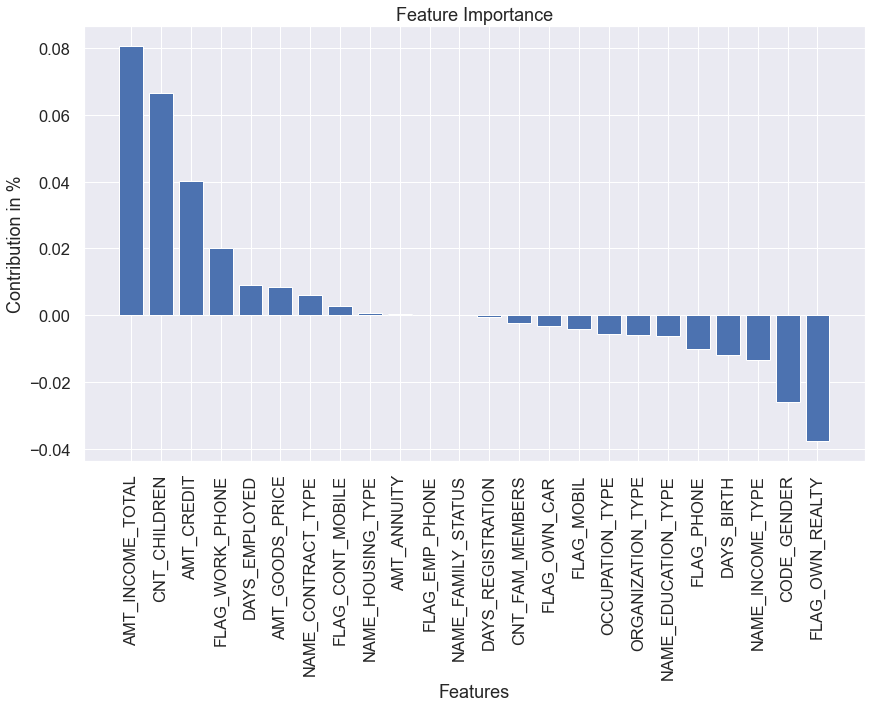

Feature: AMT_INCOME_TOTAL, Score: 0.08057714469789735
Feature: CNT_CHILDREN, Score: 0.06652613221632361
Feature: AMT_CREDIT, Score: 0.04019093133898104
Feature: FLAG_WORK_PHONE, Score: 0.019989371310576775
Feature: DAYS_EMPLOYED, Score: 0.009110184447481596
Feature: AMT_GOODS_PRICE, Score: 0.008578365588692908
Feature: NAME_CONTRACT_TYPE, Score: 0.006030030216800808
Feature: FLAG_CONT_MOBILE, Score: 0.002708058613600262
Feature: NAME_HOUSING_TYPE, Score: 0.0007879324397028055
Feature: AMT_ANNUITY, Score: 0.00026907822820780185
Feature: FLAG_EMP_PHONE, Score: -1.637553989225136e-05
Feature: NAME_FAMILY_STATUS, Score: -6.559968875046657e-05
Feature: DAYS_REGISTRATION, Score: -0.0005111969344878903
Feature: CNT_FAM_MEMBERS, Score: -0.002390206382275249
Feature: FLAG_OWN_CAR, Score: -0.0030913395939063852
Feature: FLAG_MOBIL, Score: -0.004077761855087561
Feature: OCCUPATION_TYPE, Score: -0.005759678889662003
Feature: ORGANIZATION_TYPE, Score: -0.005909763103119168
Feature: NAME_EDUCATION_T

In [122]:
#
best_params_lr = {'C': 16.65555874703546,
                  'class_weight': 'balanced',
                  'fit_intercept': True,
                  'penalty': 'l2',
                  'solver': 'saga',
                  'tol': 1.0433459097788695}

#
results_lr = lr_instance.executes_algo_function(best_params_lr)                                        

### LIME

In [ ]:
#
lr_instance.executes_algo_function_lime(best_params_lr)

### SHAP

In [ ]:
# Force
#  options: force, summary, embedding, dependence, decision, bar, waterfall
lr_instance.executes_algo_function_shap(best_params_lr,
                                        53,
                                        100,
                                        "force",
                                        "",
                                        0)
                                       

### Learning curves

In [ ]:
# Visualize learning curves
title = r"Learning Curves LogisticRegression after optimization (hyperopt)"
plot_learning_curve(results_lr[1], 
                    title, 
                    results_lr[2], 
                    results_lr[3], 
                    results_lr[4], 
                    results_lr[5],
                    results_lr[6],
                    cv=3
                   )


## XGBRFClassifier

In [129]:
#
rf_instance = ClassifierBestParamsSearch(dataframe=df_merge,
                                           numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'),
                                                                   StandardScaler()], 
                                           categorical_transformers=[SimpleImputer(fill_value="missing", strategy='constant'), 
                                                                     OneHotEncoder(handle_unknown="ignore")], 
                                           target='TARGET',
                                           classifier_type=XGBRFClassifier,
                                           score=fbeta_score,
                                           max_evals=100)

# hyperparameters optimization (hyperopt)
#rf_best_params = rf_instance.trials_classifier()

* Imblearn:
y_train labels before resampling: Counter({0.0: 115251, 1.0: 10452})
y_train labels after resampling: Counter({0.0: 23050, 1.0: 23050})

* Stats:
roc_auc_score: 0.6408109398677503
f1_score: 0.23877049829675986
accuracy_score: 0.6942340736969388
recall_score: 0.5767317259854573
precision_score: 0.15054945054945054
fbeta_score: 0.5610077033651542

* Feature Importance:


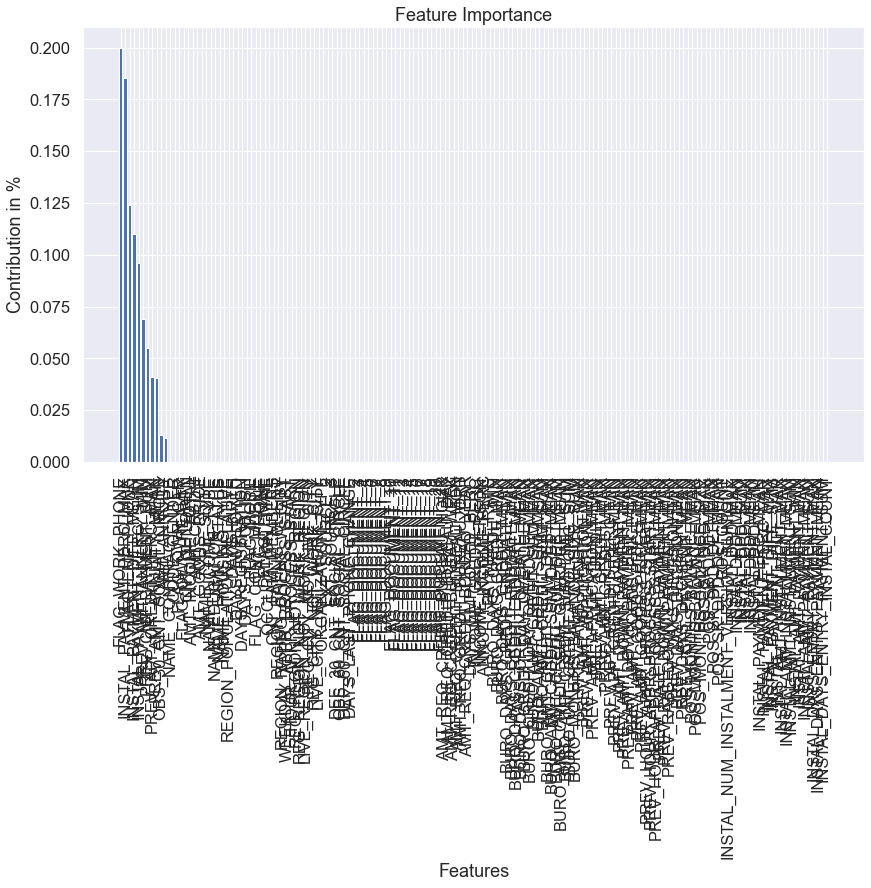

Feature: FLAG_WORK_PHONE, Score: 0.19993012
Feature: INSTAL_PAYMENT_PERC_MAX, Score: 0.1853913
Feature: FLAG_EMP_PHONE, Score: 0.123958945
Feature: INSTAL_PAYMENT_DIFF_MEAN, Score: 0.11005925
Feature: INSTAL_PAYMENT_PERC_SUM, Score: 0.09585612
Feature: PREV_AMT_ANNUITY_MIN, Score: 0.06896562
Feature: PREV_CNT_PAYMENT_SUM, Score: 0.055040352
Feature: PREV_APP_CREDIT_PERC_MAX, Score: 0.041130368
Feature: PREV_AMT_ANNUITY_MEAN, Score: 0.040622786
Feature: OBS_30_CNT_SOCIAL_CIRCLE, Score: 0.012912945
Feature: AMT_ANNUITY, Score: 0.011722702
Feature: NAME_CONTRACT_TYPE, Score: 0.0
Feature: CODE_GENDER, Score: 0.0
Feature: FLAG_OWN_CAR, Score: 0.0
Feature: FLAG_OWN_REALTY, Score: 0.0
Feature: CNT_CHILDREN, Score: 0.0
Feature: AMT_INCOME_TOTAL, Score: 0.0
Feature: AMT_CREDIT, Score: 0.0
Feature: AMT_GOODS_PRICE, Score: 0.0
Feature: NAME_TYPE_SUITE, Score: 0.0
Feature: NAME_INCOME_TYPE, Score: 0.0
Feature: NAME_EDUCATION_TYPE, Score: 0.0
Feature: NAME_FAMILY_STATUS, Score: 0.0
Feature: NAME_HO

In [128]:
#
best_params_rf = {'colsample_bynode': 0.6,
                  'learning_rate': 0.5065033401034156,
                  'max_depth': 2,
                  'num_parallel_tree': 90,
                  'objective': 'reg:squarederror',
                  'subsample': 0.9,
                  'tree_method': 'exact'}

#
results_rf = rf_instance.executes_algo_function(best_params_rf)
                                                

### LIME

In [ ]:
#
rf_instance.executes_algo_function_lime(best_params_rf)

### SHAP

In [ ]:
'''
# options: force, summary, embedding, dependence, decision, bar, waterfall 
rf_instance.executes_algo_function_shap(best_params_rf,
                                        53,
                                        100,
                                        "force",
                                        "",
                                        0)'''

### Learning curves

In [ ]:
# Visualize learning curves
title = r"Learning Curves XGBoostRandomForestClassifier after optimization (hyperopt)"
plot_learning_curve(results_rf[1], 
                    title, 
                    results_rf[2], 
                    results_rf[3], 
                    results_rf[4], 
                    results_rf[5],
                    results_rf[6],
                    cv=3
                   )


## XGBClassifier

In [125]:
#
xgb_instance = ClassifierBestParamsSearch(dataframe=df_merge_select,
                                          numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), 
                                                                  StandardScaler()], 
                                          categorical_transformers=[SimpleImputer(fill_value="missing", strategy='constant'), 
                                                                    OneHotEncoder(handle_unknown="ignore")], 
                                          target='TARGET',
                                          classifier_type=XGBClassifier,
                                          score=fbeta_score,
                                          max_evals=100)

# hyperparameters optimization (hyperopt)
#xgb_best_params = xgb_instance.trials_classifier()

[02:00:32] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117948562/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
* Imblearn:
y_train labels before resampling: Counter({0.0: 115251, 1.0: 10452})
y_train labels after resampling: Counter({0.0: 23050, 1.0: 23050})

* Stats:
roc_auc_score: 0.5954866415023548
f1_score: 0.20582428430404737
accuracy_score: 0.6928021383567746
recall_score: 0.47876004592422505
precision_score: 0.1310908519333543
fbeta_score: 0.46651011840808143

* Feature Importance:


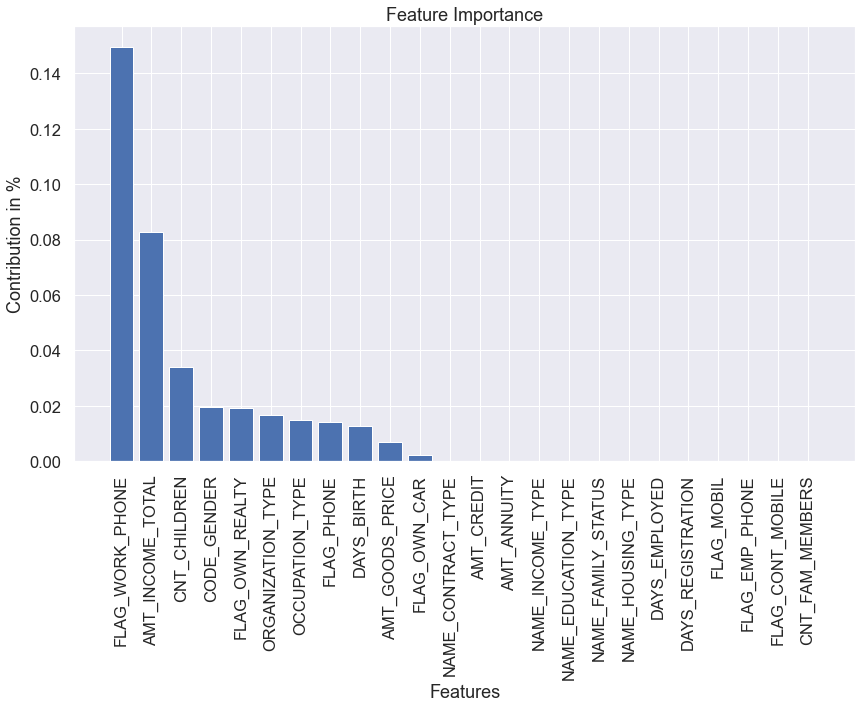

Feature: FLAG_WORK_PHONE, Score: 0.14947009
Feature: AMT_INCOME_TOTAL, Score: 0.08287336
Feature: CNT_CHILDREN, Score: 0.033956047
Feature: CODE_GENDER, Score: 0.019533128
Feature: FLAG_OWN_REALTY, Score: 0.01909874
Feature: ORGANIZATION_TYPE, Score: 0.016704388
Feature: OCCUPATION_TYPE, Score: 0.01489863
Feature: FLAG_PHONE, Score: 0.014251531
Feature: DAYS_BIRTH, Score: 0.0128575815
Feature: AMT_GOODS_PRICE, Score: 0.0067765987
Feature: FLAG_OWN_CAR, Score: 0.0020484412
Feature: NAME_CONTRACT_TYPE, Score: 0.0
Feature: AMT_CREDIT, Score: 0.0
Feature: AMT_ANNUITY, Score: 0.0
Feature: NAME_INCOME_TYPE, Score: 0.0
Feature: NAME_EDUCATION_TYPE, Score: 0.0
Feature: NAME_FAMILY_STATUS, Score: 0.0
Feature: NAME_HOUSING_TYPE, Score: 0.0
Feature: DAYS_EMPLOYED, Score: 0.0
Feature: DAYS_REGISTRATION, Score: 0.0
Feature: FLAG_MOBIL, Score: 0.0
Feature: FLAG_EMP_PHONE, Score: 0.0
Feature: FLAG_CONT_MOBILE, Score: 0.0
Feature: CNT_FAM_MEMBERS, Score: 0.0



In [124]:
#
best_params_xgb = {'colsample_bytree': 0.720686996321736,
                   'gamma': 8.860452612468633,
                   'learning_rate': 0.00018167733830588059,
                   'max_depth': 5,
                   'min_child_weight': 10.0,
                   'n_estimators': 150,
                   'reg_alpha': 152.0,
                   'reg_lambda': 0.48206908893425726,
                   'seed': 0}


#
results_xgb = xgb_instance.executes_algo_function(best_params_xgb)            

### LIME

In [ ]:
#
xgb_instance.executes_algo_function_lime(best_params_xgb)

### SHAP

In [ ]:
# options: force, summary, embedding, dependence, decision, bar, waterfall 
xgb_instance.executes_algo_function_shap(best_params_xgb,
                                         53,
                                         100,
                                         "decision",
                                         "",
                                         0)


### Learning curves

In [ ]:
# Visualize learning curves
title = r"Learning Curves XGBoostClassifier after optimization (hyperopt)"
plot_learning_curve(results_xgb[1], 
                    title, 
                    results_xgb[2], 
                    results_xgb[3], 
                    results_xgb[4], 
                    results_xgb[5],
                    results_xgb[6],
                    cv=3
                   )


## Stats

In [ ]:
# 
table = stats_comparaison_function('f1_score', 
                                   'descending',
                                   dummy=results_dummy[0],
                                   logistic_regression=results_lr[0],
                                   random_forest=results_rf[0],
                                   xgboost=results_xgb[0]) 


#
table.style.highlight_min(color = 'red', axis = 0).highlight_max(color = 'green', axis = 0)


# Dashboard radar plot data

In [137]:
#
radar_list = ['AMT_INCOME_TOTAL',
              'AMT_CREDIT',
              'CNT_CHILDREN',
              'AMT_GOODS_PRICE',
              'DAYS_EMPLOYED',
              ]

#
df_radar = df_merge[radar_list]
df_radar['DAYS_EMPLOYED_YEARS'] = -df_radar['DAYS_EMPLOYED']/365
df_radar = df_radar.drop(columns="DAYS_EMPLOYED")
df_radar = inter_quartile_method_function(df_radar)
df_radar = df_radar.rank(pct = True)
    
#
info(df_radar)
df_radar.head()

5 columns
157129 rows
Rate of missing values : 3.0812898955635175 %



,AMT_INCOME_TOTAL,AMT_CREDIT,CNT_CHILDREN,AMT_GOODS_PRICE,DAYS_EMPLOYED_YEARS
SK_ID_CURR,,,,,
100002,0.732735,0.374192,0.318962,0.366841,0.201839
100004,0.031734,0.039997,0.318962,0.052368,0.056426
100008,0.162253,0.460453,0.318962,0.528006,0.488069
100009,0.587757,0.993591,0.762463,NaN,0.772418
100010,0.991679,0.987922,0.318962,NaN,0.138158


# Data serialization

In [138]:
#
df_merge_to_pickle = df_merge_select.sample(1000)

#
info(df_merge_to_pickle)
df_merge_to_pickle.head()

25 columns
1000 rows
Rate of missing values : 0.0 %



,TARGET,NAME_CONTRACT_TYPE,OCCUPATION_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,CNT_FAM_MEMBERS,ORGANIZATION_TYPE
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,
264740,0.0,Cash loans,Managers,0,1,0,0,256500.0,1370803.5,40081.5,1197000.0,Working,Higher education,Married,House / apartment,-21165,-2154.0,-982.0,1,1,0,1,0,2.0,Business Entity Type 3
406991,0.0,Cash loans,Accountants,1,0,0,0,112500.0,1252363.5,49797.0,1152000.0,Working,Secondary / secondary special,Married,House / apartment,-20081,-565.0,-4077.0,1,1,0,1,0,2.0,Self-employed
343326,0.0,Cash loans,Medicine staff,1,0,0,0,157500.0,1058197.5,38137.5,913500.0,State servant,Higher education,Married,House / apartment,-16685,-969.0,-885.0,1,1,0,1,0,2.0,Medicine
281739,0.0,Cash loans,Low-skill Laborers,1,0,1,1,135000.0,448056.0,17019.0,315000.0,Working,Secondary / secondary special,Single / not married,House / apartment,-15124,-717.0,-7643.0,1,1,0,1,1,2.0,Business Entity Type 3
134030,0.0,Revolving loans,Sales staff,1,0,1,2,157500.0,180000.0,9000.0,180000.0,Commercial associate,Secondary / secondary special,Married,With parents,-7980,-258.0,-2763.0,1,1,0,1,0,4.0,Business Entity Type 3


In [139]:
#
df_radar = df_radar.filter(items=df_merge_to_pickle.index, axis=0)

#
info(df_radar)
df_radar.head()

5 columns
1000 rows
Rate of missing values : 3.1399999999999997 %



,AMT_INCOME_TOTAL,AMT_CREDIT,CNT_CHILDREN,AMT_GOODS_PRICE,DAYS_EMPLOYED_YEARS
SK_ID_CURR,,,,,
264740,0.885831,0.975344,0.318962,0.968595,0.609644
406991,0.235784,0.934493,0.318962,0.964680,0.177720
343326,0.521718,0.871105,0.318962,0.888548,0.312160
281739,0.389887,0.393568,0.762463,0.339100,0.227649
134030,0.521718,0.088243,0.943503,0.104128,0.070140


In [140]:
# model
pickle.dump(results_lr[1], open("model.pkl", "wb"))

# dataframe
df_merge_to_pickle.to_pickle("df_customers_sample.pkl")
df_radar.to_pickle("df_radar_sample.pkl")